# Lecture 12 Part 2: Generative Adversarial Network
This notebook introduces a new computer vision technique, built from many of the fundamentals we're already familiar with. The motivation is that people are quite good at imagining things. If I were to tell you to imagine a picture of a house and draw it, you could do a decent job assuming you have some artistic talent. How do we get a neural network to do something similar? Well, just like how there are convolutional layers that squish an image down to an idea, there also transposed convolutions that take an idea and unsquish them into an image. Making a network out of these transpose convolutions allows a simple features space to be expanded. This lets a network create images, but how do you create realistic looking images? To do this, we use a second network, called the discriminator, to take an image and decide whether its real or fake. The goal of the generator is create images that fool the discriminator and goal of the discriminator is to always catch the fake images of the generator. Thus, these two networks are fighting against eachother. This type of network is called a generative adversarial network due to this dual network battle.

![network](http://gluon.mxnet.io/_images/dcgan.png)

In [9]:
# get started by importing the usual
import os
import matplotlib as mpl
import tarfile
import matplotlib.image as mpimg
from matplotlib import pyplot as plt

import mxnet as mx
from mxnet import gluon
from mxnet import ndarray as nd
from mxnet.gluon import nn, utils
from mxnet.gluon.nn import Dense, Activation, Conv2D, Conv2DTranspose, \
    BatchNorm, LeakyReLU, Flatten, HybridSequential, HybridBlock, Dropout
from mxnet import autograd
import numpy as np

In [2]:
# set some hyper parameters
epochs = 100
batch_size = 10

use_gpu = True
ctx = mx.gpu(1) if use_gpu else mx.cpu()

lr = 0.0002
beta1 = 0.5
lambda1 = 100

pool_size = 50

To demonstrate image generation, we're going to use a pixel to pixel conversion. The idea is to take a sketch of an object and turn it into a realistic image. This can be useful for super low resolution cameras or things like google maps. In our case, we'll do it on the facades of buildings.

In [3]:
dataset = '/data2/facades'

img_wd = 256
img_ht = 256
train_img_path = '%s/train' % (dataset)
val_img_path = '%s/val' % (dataset)

def download_data(dataset):
    if not os.path.exists(dataset):
        url = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'
        data_file = utils.download(url)
        with tarfile.open(data_file) as tar:
            tar.extractall(path='/data2/.')
        os.remove(data_file)

def load_data(path, batch_size, is_reversed=False):
    img_in_list = []
    img_out_list = []
    for path, _, fnames in os.walk(path):
        for fname in fnames:
            if not fname.endswith('.jpg'):
                continue
            img = os.path.join(path, fname)
            img_arr = mx.image.imread(img).astype(np.float32)/127.5 - 1
            img_arr = mx.image.imresize(img_arr, img_wd * 2, img_ht)
            # Crop input and output images
            img_arr_in, img_arr_out = [mx.image.fixed_crop(img_arr, 0, 0, img_wd, img_ht),
                                       mx.image.fixed_crop(img_arr, img_wd, 0, img_wd, img_ht)]
            img_arr_in, img_arr_out = [nd.transpose(img_arr_in, (2,0,1)),
                                       nd.transpose(img_arr_out, (2,0,1))]
            img_arr_in, img_arr_out = [img_arr_in.reshape((1,) + img_arr_in.shape),
                                       img_arr_out.reshape((1,) + img_arr_out.shape)]
            img_in_list.append(img_arr_out if is_reversed else img_arr_in)
            img_out_list.append(img_arr_in if is_reversed else img_arr_out)

    return mx.io.NDArrayIter(data=[nd.concat(*img_in_list, dim=0), nd.concat(*img_out_list, dim=0)],
                             batch_size=batch_size)

download_data(dataset)
train_data = load_data(train_img_path, batch_size, is_reversed=True)
val_data = load_data(val_img_path, batch_size, is_reversed=True)

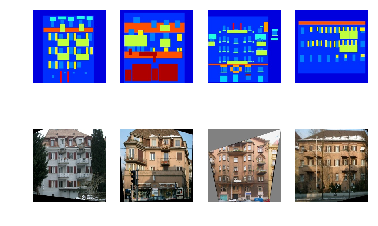

In [4]:
def visualize(img_arr):
    plt.imshow(((img_arr.asnumpy().transpose(1, 2, 0) + 1.0) * 127.5).astype(np.uint8))
    plt.axis('off')

def preview_train_data():
    img_in_list, img_out_list = train_data.next().data
    for i in range(4):
        plt.subplot(2,4,i+1)
        visualize(img_in_list[i])
        plt.subplot(2,4,i+5)
        visualize(img_out_list[i])
    plt.show()

preview_train_data()

![unet](http://gluon.mxnet.io/_images/Pixel2pixel-Unet.png)

This is actually a slight modification of the standard GAN, instead of starting with pure ideas, we start with a basic image and we want to produce a detailed image. Thus, we intially reduce the basic image to ideas, a step called encoding, then expand those ideas out to a realistic image, the decoding step. We make one more minor adjustment which is to pass along input data along with output for each layer, this basically just provides more context to downstream layers. This is important because the input sketch data is useful at every layer.

In [5]:
# Define Unet generator skip block
class UnetSkipUnit(HybridBlock):
    def __init__(self, inner_channels, outer_channels, inner_block=None, innermost=False, outermost=False,
                 use_dropout=False, use_bias=False):
        super(UnetSkipUnit, self).__init__()

        with self.name_scope():
            self.outermost = outermost
            en_conv = Conv2D(channels=inner_channels, kernel_size=4, strides=2, padding=1,
                             in_channels=outer_channels, use_bias=use_bias)
            en_relu = LeakyReLU(alpha=0.2)
            en_norm = BatchNorm(momentum=0.1, in_channels=inner_channels)
            de_relu = Activation(activation='relu')
            de_norm = BatchNorm(momentum=0.1, in_channels=outer_channels)

            if innermost:
                de_conv = Conv2DTranspose(channels=outer_channels, kernel_size=4, strides=2, padding=1,
                                          in_channels=inner_channels, use_bias=use_bias)
                encoder = [en_relu, en_conv]
                decoder = [de_relu, de_conv, de_norm]
                model = encoder + decoder
            elif outermost:
                de_conv = Conv2DTranspose(channels=outer_channels, kernel_size=4, strides=2, padding=1,
                                          in_channels=inner_channels * 2)
                encoder = [en_conv]
                decoder = [de_relu, de_conv, Activation(activation='tanh')]
                model = encoder + [inner_block] + decoder
            else:
                de_conv = Conv2DTranspose(channels=outer_channels, kernel_size=4, strides=2, padding=1,
                                          in_channels=inner_channels * 2, use_bias=use_bias)
                encoder = [en_relu, en_conv, en_norm]
                decoder = [de_relu, de_conv, de_norm]
                model = encoder + [inner_block] + decoder
            if use_dropout:
                model += [Dropout(rate=0.5)]

            self.model = HybridSequential()
            with self.model.name_scope():
                for block in model:
                    self.model.add(block)

    def hybrid_forward(self, F, x):
        if self.outermost:
            return self.model(x)
        else:
            return F.concat(self.model(x), x, dim=1)

# Define Unet generator, made up of a bunch of blocks
class UnetGenerator(HybridBlock):
    def __init__(self, in_channels, num_downs, ngf=64, use_dropout=True):
        super(UnetGenerator, self).__init__()

        #Build unet generator structure
        unet = UnetSkipUnit(ngf * 8, ngf * 8, innermost=True)
        for _ in range(num_downs - 5):
            unet = UnetSkipUnit(ngf * 8, ngf * 8, unet, use_dropout=use_dropout)
        unet = UnetSkipUnit(ngf * 8, ngf * 4, unet)
        unet = UnetSkipUnit(ngf * 4, ngf * 2, unet)
        unet = UnetSkipUnit(ngf * 2, ngf * 1, unet)
        unet = UnetSkipUnit(ngf, in_channels, unet, outermost=True)

        with self.name_scope():
            self.model = unet

    def hybrid_forward(self, F, x):
        return self.model(x)

# Define the discriminator, this is similar to a standard convolutional network
class Discriminator(HybridBlock):
    def __init__(self, in_channels, ndf=64, n_layers=3, use_sigmoid=False, use_bias=False):
        super(Discriminator, self).__init__()

        with self.name_scope():
            self.model = HybridSequential()
            kernel_size = 4
            padding = int(np.ceil((kernel_size - 1)/2))
            self.model.add(Conv2D(channels=ndf, kernel_size=kernel_size, strides=2,
                                  padding=padding, in_channels=in_channels))
            self.model.add(LeakyReLU(alpha=0.2))

            nf_mult = 1
            for n in range(1, n_layers):
                nf_mult_prev = nf_mult
                nf_mult = min(2 ** n, 8)
                self.model.add(Conv2D(channels=ndf * nf_mult, kernel_size=kernel_size, strides=2,
                                      padding=padding, in_channels=ndf * nf_mult_prev,
                                      use_bias=use_bias))
                self.model.add(BatchNorm(momentum=0.1, in_channels=ndf * nf_mult))
                self.model.add(LeakyReLU(alpha=0.2))

            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n_layers, 8)
            self.model.add(Conv2D(channels=ndf * nf_mult, kernel_size=kernel_size, strides=1,
                                  padding=padding, in_channels=ndf * nf_mult_prev,
                                  use_bias=use_bias))
            self.model.add(BatchNorm(momentum=0.1, in_channels=ndf * nf_mult))
            self.model.add(LeakyReLU(alpha=0.2))
            self.model.add(Conv2D(channels=1, kernel_size=kernel_size, strides=1,
                                  padding=padding, in_channels=ndf * nf_mult))
            if use_sigmoid:
                self.model.add(Activation(activation='sigmoid'))

    def hybrid_forward(self, F, x):
        out = self.model(x)
        #print(out)
        return out

In [6]:
def param_init(param):
    if param.name.find('conv') != -1:
        if param.name.find('weight') != -1:
            param.initialize(init=mx.init.Normal(0.02), ctx=ctx)
        else:
            param.initialize(init=mx.init.Zero(), ctx=ctx)
    elif param.name.find('batchnorm') != -1:
        param.initialize(init=mx.init.Zero(), ctx=ctx)
        # Initialize gamma from normal distribution with mean 1 and std 0.02
        if param.name.find('gamma') != -1:
            param.set_data(nd.random_normal(1, 0.02, param.data().shape))

def network_init(net):
    for param in net.collect_params().values():
        param_init(param)

def set_network():
    # Pixel2pixel networks
    netG = UnetGenerator(in_channels=3, num_downs=8)
    netD = Discriminator(in_channels=6)

    # Initialize parameters
    network_init(netG)
    network_init(netD)

    # trainer for the generator and the discriminator
    trainerG = gluon.Trainer(netG.collect_params(), 'adam', {'learning_rate': lr, 'beta1': beta1})
    trainerD = gluon.Trainer(netD.collect_params(), 'adam', {'learning_rate': lr, 'beta1': beta1})

    return netG, netD, trainerG, trainerD

# Loss
GAN_loss = gluon.loss.SigmoidBinaryCrossEntropyLoss()
L1_loss = gluon.loss.L1Loss()

netG, netD, trainerG, trainerD = set_network()

In [10]:
netG

UnetGenerator(
  (model): UnetSkipUnit(
    (model): HybridSequential(
      (0): Conv2D(3 -> 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): UnetSkipUnit(
        (model): HybridSequential(
          (0): LeakyReLU(0.2)
          (1): Conv2D(64 -> 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
          (2): BatchNorm(axis=1, eps=1e-05, momentum=0.1, fix_gamma=False, use_global_stats=False, in_channels=128)
          (3): UnetSkipUnit(
            (model): HybridSequential(
              (0): LeakyReLU(0.2)
              (1): Conv2D(128 -> 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
              (2): BatchNorm(axis=1, eps=1e-05, momentum=0.1, fix_gamma=False, use_global_stats=False, in_channels=256)
              (3): UnetSkipUnit(
                (model): HybridSequential(
                  (0): LeakyReLU(0.2)
                  (1): Conv2D(256 -> 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=Fa

In [11]:
netD

Discriminator(
  (model): HybridSequential(
    (0): Conv2D(6 -> 64, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(0.2)
    (2): Conv2D(64 -> 128, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2), bias=False)
    (3): BatchNorm(axis=1, eps=1e-05, momentum=0.1, fix_gamma=False, use_global_stats=False, in_channels=128)
    (4): LeakyReLU(0.2)
    (5): Conv2D(128 -> 256, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2), bias=False)
    (6): BatchNorm(axis=1, eps=1e-05, momentum=0.1, fix_gamma=False, use_global_stats=False, in_channels=256)
    (7): LeakyReLU(0.2)
    (8): Conv2D(256 -> 512, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2), bias=False)
    (9): BatchNorm(axis=1, eps=1e-05, momentum=0.1, fix_gamma=False, use_global_stats=False, in_channels=512)
    (10): LeakyReLU(0.2)
    (11): Conv2D(512 -> 1, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
  )
)

In [7]:
class ImagePool():
    def __init__(self, pool_size):
        self.pool_size = pool_size
        if self.pool_size > 0:
            self.num_imgs = 0
            self.images = []

    def query(self, images):
        if self.pool_size == 0:
            return images
        ret_imgs = []
        for i in range(images.shape[0]):
            image = nd.expand_dims(images[i], axis=0)
            if self.num_imgs < self.pool_size:
                self.num_imgs = self.num_imgs + 1
                self.images.append(image)
                ret_imgs.append(image)
            else:
                p = nd.random_uniform(0, 1, shape=(1,)).asscalar()
                if p > 0.5:
                    random_id = nd.random_uniform(0, self.pool_size - 1, shape=(1,)).astype(np.uint8).asscalar()
                    tmp = self.images[random_id].copy()
                    self.images[random_id] = image
                    ret_imgs.append(tmp)
                else:
                    ret_imgs.append(image)
        ret_imgs = nd.concat(*ret_imgs, dim=0)
        return ret_imgs

INFO:root:speed: 2.0587857048753655 samples/s
INFO:root:discriminator loss = 0.873860, generator loss = 42.690788, binary training acc = 0.489184 at iter 0 epoch 0
INFO:root:speed: 15.250417410831156 samples/s
INFO:root:discriminator loss = 0.685236, generator loss = 41.975151, binary training acc = 0.523692 at iter 10 epoch 0
INFO:root:speed: 16.060518570878273 samples/s
INFO:root:discriminator loss = 0.698453, generator loss = 36.387981, binary training acc = 0.548809 at iter 20 epoch 0
INFO:root:speed: 16.00371179839074 samples/s
INFO:root:discriminator loss = 0.631979, generator loss = 34.229881, binary training acc = 0.568340 at iter 30 epoch 0
INFO:root:
binary training acc at epoch 0: facc=0.596499
INFO:root:time: 28.464216


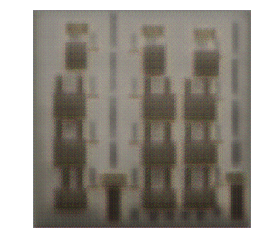

INFO:root:speed: 27.405547881745203 samples/s
INFO:root:discriminator loss = 0.469089, generator loss = 35.349232, binary training acc = 0.705837 at iter 0 epoch 1
INFO:root:speed: 23.546797974246363 samples/s
INFO:root:discriminator loss = 0.391580, generator loss = 39.994064, binary training acc = 0.762609 at iter 10 epoch 1
INFO:root:speed: 42.26727224539442 samples/s
INFO:root:discriminator loss = 0.369205, generator loss = 35.094574, binary training acc = 0.803304 at iter 20 epoch 1
INFO:root:speed: 39.396231235546836 samples/s
INFO:root:discriminator loss = 0.330703, generator loss = 33.825130, binary training acc = 0.830747 at iter 30 epoch 1
INFO:root:
binary training acc at epoch 1: facc=0.819950
INFO:root:time: 14.023173


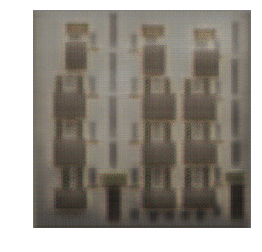

INFO:root:speed: 77.50365408601654 samples/s
INFO:root:discriminator loss = 0.349213, generator loss = 35.279324, binary training acc = 0.788490 at iter 0 epoch 2
INFO:root:speed: 43.72418854455082 samples/s
INFO:root:discriminator loss = 0.207953, generator loss = 39.610558, binary training acc = 0.906898 at iter 10 epoch 2
INFO:root:speed: 40.03447640628326 samples/s
INFO:root:discriminator loss = 0.188907, generator loss = 34.815544, binary training acc = 0.945881 at iter 20 epoch 2
INFO:root:speed: 40.505773634139814 samples/s
INFO:root:discriminator loss = 0.402148, generator loss = 32.986530, binary training acc = 0.907625 at iter 30 epoch 2
INFO:root:
binary training acc at epoch 2: facc=0.892720
INFO:root:time: 9.601661


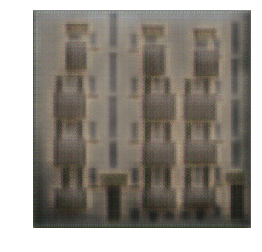

INFO:root:speed: 74.38740365277043 samples/s
INFO:root:discriminator loss = 0.176865, generator loss = 34.218437, binary training acc = 0.989714 at iter 0 epoch 3
INFO:root:speed: 39.591465325525114 samples/s
INFO:root:discriminator loss = 0.299354, generator loss = 36.986176, binary training acc = 0.929095 at iter 10 epoch 3
INFO:root:speed: 41.52036270763626 samples/s
INFO:root:discriminator loss = 0.165307, generator loss = 35.623245, binary training acc = 0.946733 at iter 20 epoch 3
INFO:root:speed: 39.68939667783895 samples/s
INFO:root:discriminator loss = 0.239558, generator loss = 32.689369, binary training acc = 0.954307 at iter 30 epoch 3
INFO:root:
binary training acc at epoch 3: facc=0.901095
INFO:root:time: 9.689335


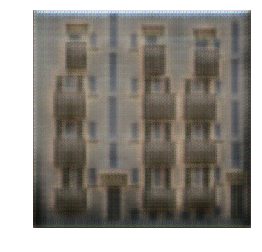

INFO:root:speed: 81.52020073428945 samples/s
INFO:root:discriminator loss = 0.490761, generator loss = 33.799725, binary training acc = 0.859714 at iter 0 epoch 4
INFO:root:speed: 39.76642474175978 samples/s
INFO:root:discriminator loss = 0.183577, generator loss = 37.090401, binary training acc = 0.899462 at iter 10 epoch 4
INFO:root:speed: 40.21218684176971 samples/s
INFO:root:discriminator loss = 0.223197, generator loss = 33.064617, binary training acc = 0.937053 at iter 20 epoch 4
INFO:root:speed: 40.711832753857834 samples/s
INFO:root:discriminator loss = 0.255965, generator loss = 32.262901, binary training acc = 0.946409 at iter 30 epoch 4
INFO:root:
binary training acc at epoch 4: facc=0.886403
INFO:root:time: 9.691474


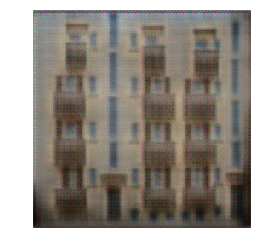

INFO:root:speed: 80.16145801480032 samples/s
INFO:root:discriminator loss = 0.448743, generator loss = 31.619827, binary training acc = 0.779224 at iter 0 epoch 5
INFO:root:speed: 38.523076810035484 samples/s
INFO:root:discriminator loss = 0.208074, generator loss = 35.119305, binary training acc = 0.928045 at iter 10 epoch 5
INFO:root:speed: 38.79882224415585 samples/s
INFO:root:discriminator loss = 0.253406, generator loss = 33.144943, binary training acc = 0.950192 at iter 20 epoch 5
INFO:root:speed: 40.52651666307552 samples/s
INFO:root:discriminator loss = 0.259765, generator loss = 33.361187, binary training acc = 0.955485 at iter 30 epoch 5
INFO:root:
binary training acc at epoch 5: facc=0.958523
INFO:root:time: 9.915494


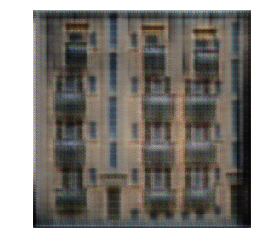

INFO:root:speed: 76.3907703907959 samples/s
INFO:root:discriminator loss = 0.191471, generator loss = 30.230839, binary training acc = 0.942204 at iter 0 epoch 6
INFO:root:speed: 39.26791339964892 samples/s
INFO:root:discriminator loss = 0.542119, generator loss = 34.232735, binary training acc = 0.819002 at iter 10 epoch 6
INFO:root:speed: 39.978153722683814 samples/s
INFO:root:discriminator loss = 0.266427, generator loss = 31.917816, binary training acc = 0.859067 at iter 20 epoch 6
INFO:root:speed: 39.8453042662925 samples/s
INFO:root:discriminator loss = 0.103620, generator loss = 31.866474, binary training acc = 0.898342 at iter 30 epoch 6
INFO:root:
binary training acc at epoch 6: facc=0.891835
INFO:root:time: 9.845690


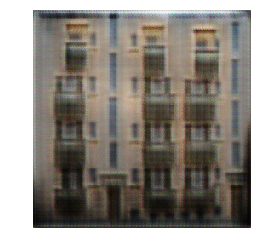

INFO:root:speed: 80.01510905417702 samples/s
INFO:root:discriminator loss = 0.170286, generator loss = 30.046545, binary training acc = 0.971551 at iter 0 epoch 7
INFO:root:speed: 39.329515064906815 samples/s
INFO:root:discriminator loss = 0.250714, generator loss = 32.212029, binary training acc = 0.856616 at iter 10 epoch 7
INFO:root:speed: 40.3088003090694 samples/s
INFO:root:discriminator loss = 0.560933, generator loss = 30.306019, binary training acc = 0.885108 at iter 20 epoch 7
INFO:root:speed: 40.93253842392848 samples/s
INFO:root:discriminator loss = 0.112920, generator loss = 30.298096, binary training acc = 0.894407 at iter 30 epoch 7
INFO:root:
binary training acc at epoch 7: facc=0.903809
INFO:root:time: 9.855407


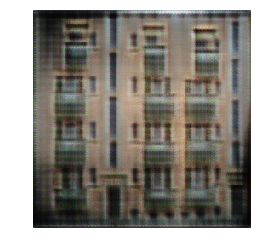

INFO:root:speed: 78.17274663913237 samples/s
INFO:root:discriminator loss = 0.129901, generator loss = 28.650599, binary training acc = 0.994939 at iter 0 epoch 8
INFO:root:speed: 41.77431354758132 samples/s
INFO:root:discriminator loss = 0.201503, generator loss = 31.718220, binary training acc = 0.820193 at iter 10 epoch 8
INFO:root:speed: 39.74637698326585 samples/s
INFO:root:discriminator loss = 0.312424, generator loss = 30.835709, binary training acc = 0.871215 at iter 20 epoch 8
INFO:root:speed: 39.81735090460667 samples/s
INFO:root:discriminator loss = 0.150618, generator loss = 30.901941, binary training acc = 0.902798 at iter 30 epoch 8
INFO:root:
binary training acc at epoch 8: facc=0.899324
INFO:root:time: 9.701936


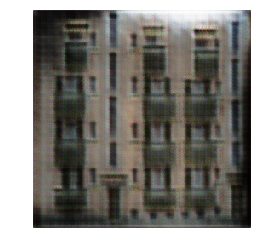

INFO:root:speed: 70.57446547166542 samples/s
INFO:root:discriminator loss = 0.460102, generator loss = 29.697521, binary training acc = 0.835673 at iter 0 epoch 9
INFO:root:speed: 41.60120291564217 samples/s
INFO:root:discriminator loss = 0.206754, generator loss = 30.631311, binary training acc = 0.856442 at iter 10 epoch 9
INFO:root:speed: 39.80650543384902 samples/s
INFO:root:discriminator loss = 0.177904, generator loss = 29.147663, binary training acc = 0.894484 at iter 20 epoch 9
INFO:root:speed: 41.47602001463521 samples/s
INFO:root:discriminator loss = 0.221429, generator loss = 30.963589, binary training acc = 0.911326 at iter 30 epoch 9
INFO:root:
binary training acc at epoch 9: facc=0.886537
INFO:root:time: 9.796226


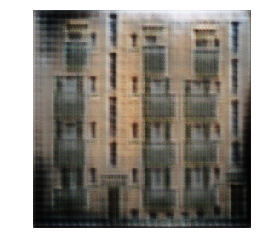

INFO:root:speed: 76.7326060668151 samples/s
INFO:root:discriminator loss = 0.210759, generator loss = 28.528070, binary training acc = 0.952898 at iter 0 epoch 10
INFO:root:speed: 43.138360840530254 samples/s
INFO:root:discriminator loss = 0.107491, generator loss = 30.904623, binary training acc = 0.875469 at iter 10 epoch 10
INFO:root:speed: 43.14621536157282 samples/s
INFO:root:discriminator loss = 0.638382, generator loss = 28.561157, binary training acc = 0.870465 at iter 20 epoch 10
INFO:root:speed: 39.5394748625787 samples/s
INFO:root:discriminator loss = 0.111108, generator loss = 28.856888, binary training acc = 0.880387 at iter 30 epoch 10
INFO:root:
binary training acc at epoch 10: facc=0.899876
INFO:root:time: 9.495788


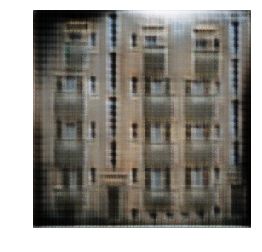

INFO:root:speed: 82.70782433453029 samples/s
INFO:root:discriminator loss = 0.279985, generator loss = 28.873047, binary training acc = 0.975633 at iter 0 epoch 11
INFO:root:speed: 39.11626406134299 samples/s
INFO:root:discriminator loss = 0.189654, generator loss = 30.525045, binary training acc = 0.846805 at iter 10 epoch 11
INFO:root:speed: 39.45363405220784 samples/s
INFO:root:discriminator loss = 0.424744, generator loss = 27.193508, binary training acc = 0.847011 at iter 20 epoch 11
INFO:root:speed: 39.82362659273466 samples/s
INFO:root:discriminator loss = 0.196493, generator loss = 28.362751, binary training acc = 0.862337 at iter 30 epoch 11
INFO:root:
binary training acc at epoch 11: facc=0.864478
INFO:root:time: 9.822470


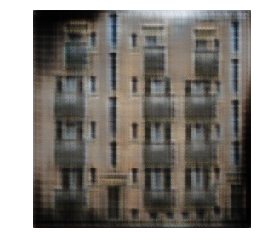

INFO:root:speed: 78.84667369731012 samples/s
INFO:root:discriminator loss = 0.181785, generator loss = 25.955521, binary training acc = 0.993265 at iter 0 epoch 12
INFO:root:speed: 40.56143635488007 samples/s
INFO:root:discriminator loss = 0.178168, generator loss = 29.454983, binary training acc = 0.945065 at iter 10 epoch 12
INFO:root:speed: 40.10659894108659 samples/s
INFO:root:discriminator loss = 0.484145, generator loss = 27.381329, binary training acc = 0.884206 at iter 20 epoch 12
INFO:root:speed: 41.05216692554867 samples/s
INFO:root:discriminator loss = 0.313868, generator loss = 30.081564, binary training acc = 0.901477 at iter 30 epoch 12
INFO:root:
binary training acc at epoch 12: facc=0.871050
INFO:root:time: 9.735098


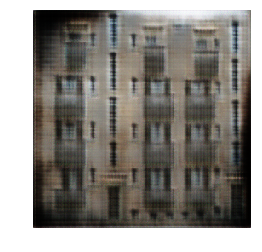

INFO:root:speed: 76.30196944504073 samples/s
INFO:root:discriminator loss = 0.270197, generator loss = 25.705444, binary training acc = 0.915184 at iter 0 epoch 13
INFO:root:speed: 40.98225208218525 samples/s
INFO:root:discriminator loss = 0.153038, generator loss = 28.338953, binary training acc = 0.841121 at iter 10 epoch 13
INFO:root:speed: 40.439889314191504 samples/s
INFO:root:discriminator loss = 0.208367, generator loss = 27.044168, binary training acc = 0.856960 at iter 20 epoch 13
INFO:root:speed: 39.3546086780287 samples/s
INFO:root:discriminator loss = 0.147239, generator loss = 28.223743, binary training acc = 0.877498 at iter 30 epoch 13
INFO:root:
binary training acc at epoch 13: facc=0.878387
INFO:root:time: 9.680200


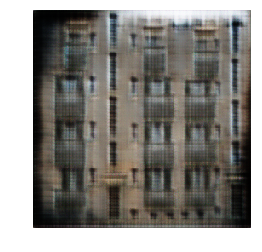

INFO:root:speed: 77.51181812469738 samples/s
INFO:root:discriminator loss = 0.223625, generator loss = 25.068817, binary training acc = 0.979510 at iter 0 epoch 14
INFO:root:speed: 40.39856255496127 samples/s
INFO:root:discriminator loss = 0.191846, generator loss = 28.748837, binary training acc = 0.807224 at iter 10 epoch 14
INFO:root:speed: 41.01992755040567 samples/s
INFO:root:discriminator loss = 0.234539, generator loss = 25.861912, binary training acc = 0.834097 at iter 20 epoch 14
INFO:root:speed: 39.99988555940945 samples/s
INFO:root:discriminator loss = 0.446130, generator loss = 28.776657, binary training acc = 0.820740 at iter 30 epoch 14
INFO:root:
binary training acc at epoch 14: facc=0.849754
INFO:root:time: 9.680858


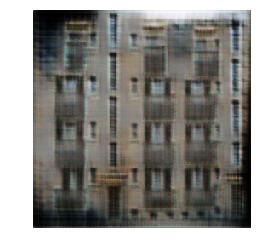

INFO:root:speed: 77.06986683718563 samples/s
INFO:root:discriminator loss = 0.191602, generator loss = 24.633333, binary training acc = 0.997102 at iter 0 epoch 15
INFO:root:speed: 41.907502437932635 samples/s
INFO:root:discriminator loss = 0.350850, generator loss = 28.218475, binary training acc = 0.838894 at iter 10 epoch 15
INFO:root:speed: 38.98718740007585 samples/s
INFO:root:discriminator loss = 0.382822, generator loss = 25.901800, binary training acc = 0.851854 at iter 20 epoch 15
INFO:root:speed: 39.98444208872585 samples/s
INFO:root:discriminator loss = 0.304418, generator loss = 28.363682, binary training acc = 0.853633 at iter 30 epoch 15
INFO:root:
binary training acc at epoch 15: facc=0.832501
INFO:root:time: 9.547731


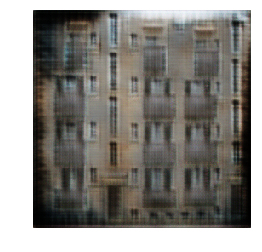

INFO:root:speed: 79.43215992848972 samples/s
INFO:root:discriminator loss = 0.235060, generator loss = 24.225576, binary training acc = 0.922735 at iter 0 epoch 16
INFO:root:speed: 43.4747871765929 samples/s
INFO:root:discriminator loss = 0.244196, generator loss = 27.762074, binary training acc = 0.847911 at iter 10 epoch 16
INFO:root:speed: 39.78596436976448 samples/s
INFO:root:discriminator loss = 0.306737, generator loss = 25.080215, binary training acc = 0.795878 at iter 20 epoch 16
INFO:root:speed: 40.595158937788604 samples/s
INFO:root:discriminator loss = 0.173558, generator loss = 26.858271, binary training acc = 0.843329 at iter 30 epoch 16
INFO:root:
binary training acc at epoch 16: facc=0.826867
INFO:root:time: 9.582805


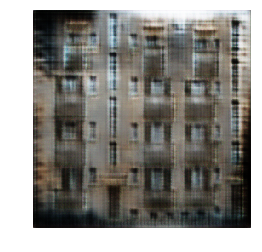

INFO:root:speed: 75.44539958520629 samples/s
INFO:root:discriminator loss = 0.241226, generator loss = 23.114859, binary training acc = 0.843510 at iter 0 epoch 17
INFO:root:speed: 39.24616151890538 samples/s
INFO:root:discriminator loss = 0.138701, generator loss = 27.617132, binary training acc = 0.783358 at iter 10 epoch 17
INFO:root:speed: 41.26858747489774 samples/s
INFO:root:discriminator loss = 0.327878, generator loss = 24.378119, binary training acc = 0.838321 at iter 20 epoch 17
INFO:root:speed: 40.79530489216386 samples/s
INFO:root:discriminator loss = 0.146860, generator loss = 26.233103, binary training acc = 0.847755 at iter 30 epoch 17
INFO:root:
binary training acc at epoch 17: facc=0.846140
INFO:root:time: 9.835229


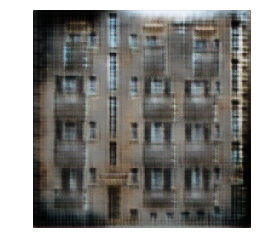

INFO:root:speed: 80.55017505046024 samples/s
INFO:root:discriminator loss = 0.256044, generator loss = 23.499323, binary training acc = 0.902653 at iter 0 epoch 18
INFO:root:speed: 40.77329494142545 samples/s
INFO:root:discriminator loss = 0.497569, generator loss = 27.114954, binary training acc = 0.783607 at iter 10 epoch 18
INFO:root:speed: 40.9380517671678 samples/s
INFO:root:discriminator loss = 0.321305, generator loss = 24.976368, binary training acc = 0.840008 at iter 20 epoch 18
INFO:root:speed: 41.02839401228415 samples/s
INFO:root:discriminator loss = 0.164369, generator loss = 26.086115, binary training acc = 0.825476 at iter 30 epoch 18
INFO:root:
binary training acc at epoch 18: facc=0.809319
INFO:root:time: 9.695415


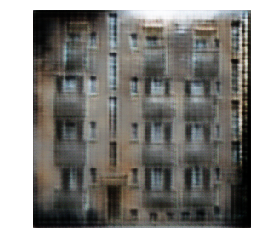

INFO:root:speed: 79.59933728960559 samples/s
INFO:root:discriminator loss = 0.275825, generator loss = 23.204271, binary training acc = 0.918898 at iter 0 epoch 19
INFO:root:speed: 40.22610920683392 samples/s
INFO:root:discriminator loss = 0.300820, generator loss = 26.707479, binary training acc = 0.793109 at iter 10 epoch 19
INFO:root:speed: 39.8585191647233 samples/s
INFO:root:discriminator loss = 0.186689, generator loss = 23.775686, binary training acc = 0.879228 at iter 20 epoch 19
INFO:root:speed: 41.93025127336163 samples/s
INFO:root:discriminator loss = 0.153586, generator loss = 25.501995, binary training acc = 0.869402 at iter 30 epoch 19
INFO:root:
binary training acc at epoch 19: facc=0.820345
INFO:root:time: 9.527471


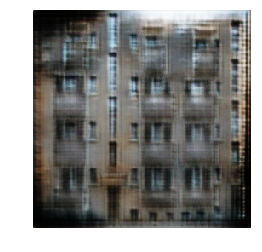

INFO:root:speed: 81.29157799665865 samples/s
INFO:root:discriminator loss = 0.307354, generator loss = 21.687885, binary training acc = 0.751224 at iter 0 epoch 20
INFO:root:speed: 42.12011295486224 samples/s
INFO:root:discriminator loss = 0.782625, generator loss = 27.168127, binary training acc = 0.732950 at iter 10 epoch 20
INFO:root:speed: 39.69311515374053 samples/s
INFO:root:discriminator loss = 0.137778, generator loss = 24.268272, binary training acc = 0.787648 at iter 20 epoch 20
INFO:root:speed: 41.86822148820058 samples/s
INFO:root:discriminator loss = 0.191564, generator loss = 25.332363, binary training acc = 0.815962 at iter 30 epoch 20
INFO:root:
binary training acc at epoch 20: facc=0.808110
INFO:root:time: 9.739384


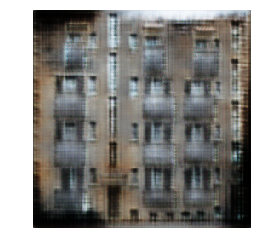

INFO:root:speed: 76.00566105091865 samples/s
INFO:root:discriminator loss = 0.270199, generator loss = 22.926580, binary training acc = 0.956082 at iter 0 epoch 21
INFO:root:speed: 42.4712119923367 samples/s
INFO:root:discriminator loss = 0.154152, generator loss = 25.063995, binary training acc = 0.882583 at iter 10 epoch 21
INFO:root:speed: 42.559816866022395 samples/s
INFO:root:discriminator loss = 0.228858, generator loss = 24.548569, binary training acc = 0.865559 at iter 20 epoch 21
INFO:root:speed: 42.83735547015033 samples/s
INFO:root:discriminator loss = 0.272133, generator loss = 25.549168, binary training acc = 0.875735 at iter 30 epoch 21
INFO:root:
binary training acc at epoch 21: facc=0.855544
INFO:root:time: 9.309668


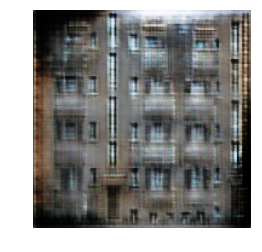

INFO:root:speed: 77.87824097799366 samples/s
INFO:root:discriminator loss = 0.427751, generator loss = 23.208706, binary training acc = 0.877020 at iter 0 epoch 22
INFO:root:speed: 39.94130177875418 samples/s
INFO:root:discriminator loss = 0.323450, generator loss = 24.897547, binary training acc = 0.782820 at iter 10 epoch 22
INFO:root:speed: 39.79177715184007 samples/s
INFO:root:discriminator loss = 0.255843, generator loss = 23.885960, binary training acc = 0.800725 at iter 20 epoch 22
INFO:root:speed: 39.358781749133634 samples/s
INFO:root:discriminator loss = 0.167897, generator loss = 24.205875, binary training acc = 0.823202 at iter 30 epoch 22
INFO:root:
binary training acc at epoch 22: facc=0.828620
INFO:root:time: 9.777424


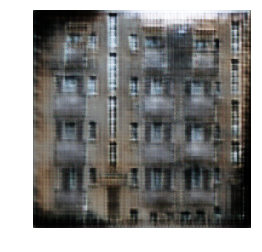

INFO:root:speed: 77.3982491622256 samples/s
INFO:root:discriminator loss = 0.224147, generator loss = 21.718842, binary training acc = 0.922939 at iter 0 epoch 23
INFO:root:speed: 22.67964911275143 samples/s
INFO:root:discriminator loss = 1.194445, generator loss = 26.287334, binary training acc = 0.688419 at iter 10 epoch 23
INFO:root:speed: 40.71080534385228 samples/s
INFO:root:discriminator loss = 0.226160, generator loss = 23.084257, binary training acc = 0.723464 at iter 20 epoch 23
INFO:root:speed: 19.77961055760406 samples/s
INFO:root:discriminator loss = 0.192106, generator loss = 24.397100, binary training acc = 0.751587 at iter 30 epoch 23
INFO:root:
binary training acc at epoch 23: facc=0.777517
INFO:root:time: 15.128902


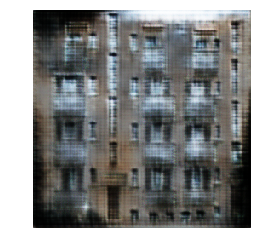

INFO:root:speed: 26.942937016938004 samples/s
INFO:root:discriminator loss = 0.281974, generator loss = 21.457222, binary training acc = 0.967347 at iter 0 epoch 24
INFO:root:speed: 17.317844468621423 samples/s
INFO:root:discriminator loss = 0.458236, generator loss = 25.507103, binary training acc = 0.832141 at iter 10 epoch 24
INFO:root:speed: 15.007608814273727 samples/s
INFO:root:discriminator loss = 0.272202, generator loss = 22.806828, binary training acc = 0.756515 at iter 20 epoch 24
INFO:root:speed: 15.089492480804024 samples/s
INFO:root:discriminator loss = 0.133906, generator loss = 23.194578, binary training acc = 0.801061 at iter 30 epoch 24
INFO:root:
binary training acc at epoch 24: facc=0.781500
INFO:root:time: 24.896868


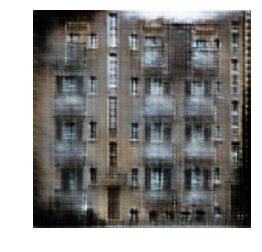

INFO:root:speed: 25.82495960909485 samples/s
INFO:root:discriminator loss = 0.180923, generator loss = 20.873264, binary training acc = 0.992000 at iter 0 epoch 25
INFO:root:speed: 15.50621497583291 samples/s
INFO:root:discriminator loss = 0.350005, generator loss = 24.756220, binary training acc = 0.875228 at iter 10 epoch 25
INFO:root:speed: 16.66120072709708 samples/s
INFO:root:discriminator loss = 0.366722, generator loss = 22.655895, binary training acc = 0.827625 at iter 20 epoch 25
INFO:root:speed: 16.212890671808236 samples/s
INFO:root:discriminator loss = 0.245321, generator loss = 23.990030, binary training acc = 0.831712 at iter 30 epoch 25
INFO:root:
binary training acc at epoch 25: facc=0.815428
INFO:root:time: 25.145980


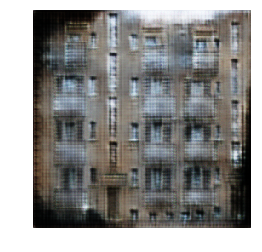

INFO:root:speed: 26.80568310872259 samples/s
INFO:root:discriminator loss = 0.336660, generator loss = 21.346746, binary training acc = 0.755551 at iter 0 epoch 26
INFO:root:speed: 16.206782630401243 samples/s
INFO:root:discriminator loss = 0.207835, generator loss = 23.910730, binary training acc = 0.835503 at iter 10 epoch 26
INFO:root:speed: 15.437386684765206 samples/s
INFO:root:discriminator loss = 0.268601, generator loss = 22.029232, binary training acc = 0.793724 at iter 20 epoch 26
INFO:root:speed: 14.423214671960984 samples/s
INFO:root:discriminator loss = 0.379830, generator loss = 24.686357, binary training acc = 0.822708 at iter 30 epoch 26
INFO:root:
binary training acc at epoch 26: facc=0.805102
INFO:root:time: 24.861492


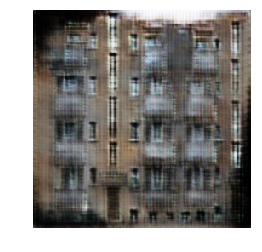

INFO:root:speed: 27.131776226291333 samples/s
INFO:root:discriminator loss = 0.329943, generator loss = 20.232330, binary training acc = 0.821469 at iter 0 epoch 27
INFO:root:speed: 15.847901401005592 samples/s
INFO:root:discriminator loss = 0.518529, generator loss = 23.990330, binary training acc = 0.745469 at iter 10 epoch 27
INFO:root:speed: 17.42297414450217 samples/s
INFO:root:discriminator loss = 0.202048, generator loss = 22.217081, binary training acc = 0.776810 at iter 20 epoch 27
INFO:root:speed: 16.79602755085696 samples/s
INFO:root:discriminator loss = 0.401059, generator loss = 24.268826, binary training acc = 0.808154 at iter 30 epoch 27
INFO:root:
binary training acc at epoch 27: facc=0.793732
INFO:root:time: 24.653431


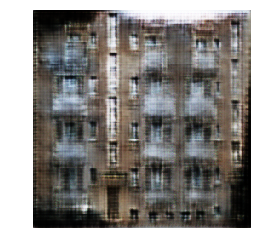

INFO:root:speed: 32.05245400531112 samples/s
INFO:root:discriminator loss = 0.220977, generator loss = 20.230154, binary training acc = 0.963755 at iter 0 epoch 28
INFO:root:speed: 14.894667108431639 samples/s
INFO:root:discriminator loss = 0.423398, generator loss = 23.594755, binary training acc = 0.759098 at iter 10 epoch 28
INFO:root:speed: 16.79995642101148 samples/s
INFO:root:discriminator loss = 0.292285, generator loss = 21.813282, binary training acc = 0.758982 at iter 20 epoch 28
INFO:root:speed: 14.628362247889173 samples/s
INFO:root:discriminator loss = 0.361857, generator loss = 23.392803, binary training acc = 0.779908 at iter 30 epoch 28
INFO:root:
binary training acc at epoch 28: facc=0.783939
INFO:root:time: 24.312486


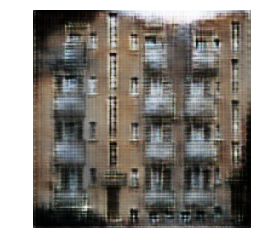

INFO:root:speed: 28.60460041028327 samples/s
INFO:root:discriminator loss = 0.400557, generator loss = 20.473797, binary training acc = 0.834245 at iter 0 epoch 29
INFO:root:speed: 16.464683380079332 samples/s
INFO:root:discriminator loss = 0.909412, generator loss = 24.123718, binary training acc = 0.783922 at iter 10 epoch 29
INFO:root:speed: 15.798790579872279 samples/s
INFO:root:discriminator loss = 0.265779, generator loss = 21.397570, binary training acc = 0.789164 at iter 20 epoch 29
INFO:root:speed: 15.608931204360955 samples/s
INFO:root:discriminator loss = 0.228783, generator loss = 22.522278, binary training acc = 0.820374 at iter 30 epoch 29
INFO:root:
binary training acc at epoch 29: facc=0.827455
INFO:root:time: 24.709685


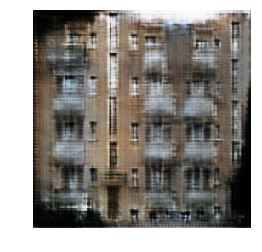

INFO:root:speed: 27.263215916300062 samples/s
INFO:root:discriminator loss = 0.285094, generator loss = 19.970490, binary training acc = 0.819592 at iter 0 epoch 30
INFO:root:speed: 15.97508159308086 samples/s
INFO:root:discriminator loss = 0.664265, generator loss = 23.505154, binary training acc = 0.752824 at iter 10 epoch 30
INFO:root:speed: 15.635411902107197 samples/s
INFO:root:discriminator loss = 0.522285, generator loss = 21.789566, binary training acc = 0.745930 at iter 20 epoch 30
INFO:root:speed: 16.88215547845407 samples/s
INFO:root:discriminator loss = 0.494932, generator loss = 22.577494, binary training acc = 0.745293 at iter 30 epoch 30
INFO:root:
binary training acc at epoch 30: facc=0.763214
INFO:root:time: 25.324473


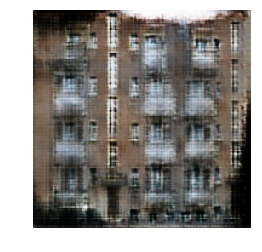

INFO:root:speed: 35.95353980404427 samples/s
INFO:root:discriminator loss = 0.329279, generator loss = 19.557831, binary training acc = 0.878939 at iter 0 epoch 31
INFO:root:speed: 16.4084139252505 samples/s
INFO:root:discriminator loss = 0.503857, generator loss = 22.917318, binary training acc = 0.786353 at iter 10 epoch 31
INFO:root:speed: 14.275084839386304 samples/s
INFO:root:discriminator loss = 0.348649, generator loss = 21.702419, binary training acc = 0.788045 at iter 20 epoch 31
INFO:root:speed: 14.650005850496244 samples/s
INFO:root:discriminator loss = 0.260519, generator loss = 21.991577, binary training acc = 0.807476 at iter 30 epoch 31
INFO:root:
binary training acc at epoch 31: facc=0.784065
INFO:root:time: 25.483991


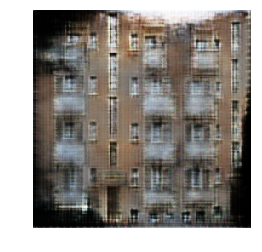

INFO:root:speed: 26.25591716902352 samples/s
INFO:root:discriminator loss = 0.316732, generator loss = 19.557434, binary training acc = 0.922449 at iter 0 epoch 32
INFO:root:speed: 14.814360623358935 samples/s
INFO:root:discriminator loss = 0.311981, generator loss = 22.160641, binary training acc = 0.780052 at iter 10 epoch 32
INFO:root:speed: 16.467463020582837 samples/s
INFO:root:discriminator loss = 0.375459, generator loss = 21.681623, binary training acc = 0.792051 at iter 20 epoch 32
INFO:root:speed: 17.841383138690322 samples/s
INFO:root:discriminator loss = 0.463843, generator loss = 22.923780, binary training acc = 0.821885 at iter 30 epoch 32
INFO:root:
binary training acc at epoch 32: facc=0.806301
INFO:root:time: 24.822139


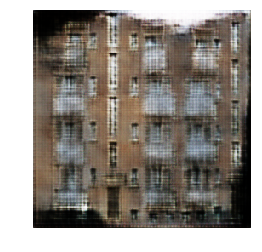

INFO:root:speed: 37.634931729941826 samples/s
INFO:root:discriminator loss = 0.276722, generator loss = 19.435925, binary training acc = 0.939143 at iter 0 epoch 33
INFO:root:speed: 15.109153379572493 samples/s
INFO:root:discriminator loss = 0.440148, generator loss = 22.070822, binary training acc = 0.811889 at iter 10 epoch 33
INFO:root:speed: 14.593670202087154 samples/s
INFO:root:discriminator loss = 0.809746, generator loss = 21.763571, binary training acc = 0.798595 at iter 20 epoch 33
INFO:root:speed: 16.055151611427654 samples/s
INFO:root:discriminator loss = 0.337800, generator loss = 21.924450, binary training acc = 0.796298 at iter 30 epoch 33
INFO:root:
binary training acc at epoch 33: facc=0.794798
INFO:root:time: 25.310493


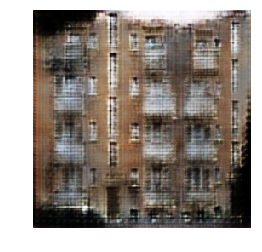

INFO:root:speed: 36.43045622495262 samples/s
INFO:root:discriminator loss = 0.159541, generator loss = 18.816494, binary training acc = 0.991469 at iter 0 epoch 34
INFO:root:speed: 14.457458891089177 samples/s
INFO:root:discriminator loss = 0.378091, generator loss = 22.141779, binary training acc = 0.816011 at iter 10 epoch 34
INFO:root:speed: 15.82434962260492 samples/s
INFO:root:discriminator loss = 0.176587, generator loss = 19.767960, binary training acc = 0.806935 at iter 20 epoch 34
INFO:root:speed: 14.258459184974292 samples/s
INFO:root:discriminator loss = 0.284290, generator loss = 21.804861, binary training acc = 0.813534 at iter 30 epoch 34
INFO:root:
binary training acc at epoch 34: facc=0.769928
INFO:root:time: 25.270793


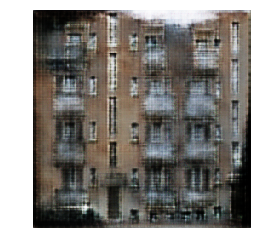

INFO:root:speed: 26.39693480417084 samples/s
INFO:root:discriminator loss = 0.358920, generator loss = 18.960300, binary training acc = 0.828163 at iter 0 epoch 35
INFO:root:speed: 16.107844842848525 samples/s
INFO:root:discriminator loss = 0.343596, generator loss = 22.031561, binary training acc = 0.783410 at iter 10 epoch 35
INFO:root:speed: 14.641797661810857 samples/s
INFO:root:discriminator loss = 0.231065, generator loss = 19.454678, binary training acc = 0.777104 at iter 20 epoch 35
INFO:root:speed: 17.746809381178828 samples/s
INFO:root:discriminator loss = 0.255756, generator loss = 21.611952, binary training acc = 0.807824 at iter 30 epoch 35
INFO:root:
binary training acc at epoch 35: facc=0.796838
INFO:root:time: 25.350128


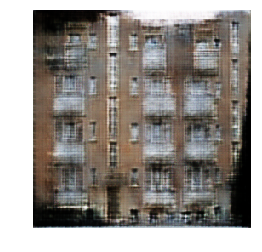

INFO:root:speed: 26.383900067999353 samples/s
INFO:root:discriminator loss = 0.369972, generator loss = 19.606203, binary training acc = 0.789714 at iter 0 epoch 36
INFO:root:speed: 14.995729351351216 samples/s
INFO:root:discriminator loss = 0.320743, generator loss = 20.766457, binary training acc = 0.772831 at iter 10 epoch 36
INFO:root:speed: 16.138443495685955 samples/s
INFO:root:discriminator loss = 0.260109, generator loss = 19.768999, binary training acc = 0.779798 at iter 20 epoch 36
INFO:root:speed: 14.230405940916542 samples/s
INFO:root:discriminator loss = 0.260046, generator loss = 21.286369, binary training acc = 0.810607 at iter 30 epoch 36
INFO:root:
binary training acc at epoch 36: facc=0.806422
INFO:root:time: 23.199706


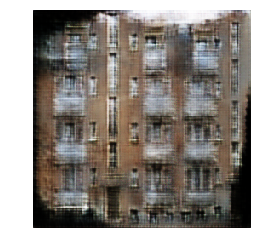

INFO:root:speed: 26.079552414297822 samples/s
INFO:root:discriminator loss = 0.219517, generator loss = 18.456860, binary training acc = 0.988735 at iter 0 epoch 37
INFO:root:speed: 16.090036293943733 samples/s
INFO:root:discriminator loss = 0.402575, generator loss = 21.531006, binary training acc = 0.786557 at iter 10 epoch 37
INFO:root:speed: 15.843830589824496 samples/s
INFO:root:discriminator loss = 0.551196, generator loss = 20.059834, binary training acc = 0.754954 at iter 20 epoch 37
INFO:root:speed: 16.54512756851983 samples/s
INFO:root:discriminator loss = 0.366438, generator loss = 22.212891, binary training acc = 0.788137 at iter 30 epoch 37
INFO:root:
binary training acc at epoch 37: facc=0.780443
INFO:root:time: 24.922400


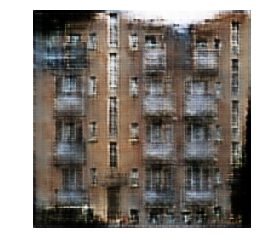

INFO:root:speed: 35.68281181275793 samples/s
INFO:root:discriminator loss = 0.793785, generator loss = 20.208040, binary training acc = 0.506367 at iter 0 epoch 38
INFO:root:speed: 15.747552810925923 samples/s
INFO:root:discriminator loss = 0.306817, generator loss = 20.248205, binary training acc = 0.758430 at iter 10 epoch 38
INFO:root:speed: 15.550678040504467 samples/s
INFO:root:discriminator loss = 0.236575, generator loss = 19.121643, binary training acc = 0.773380 at iter 20 epoch 38
INFO:root:speed: 15.923632846015888 samples/s
INFO:root:discriminator loss = 0.358228, generator loss = 21.336750, binary training acc = 0.805505 at iter 30 epoch 38
INFO:root:
binary training acc at epoch 38: facc=0.775444
INFO:root:time: 25.022681


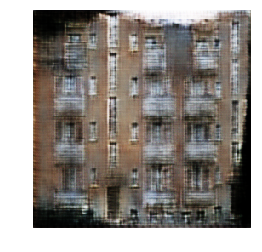

INFO:root:speed: 24.024162179407504 samples/s
INFO:root:discriminator loss = 0.432270, generator loss = 18.823866, binary training acc = 0.629265 at iter 0 epoch 39
INFO:root:speed: 18.29469509742942 samples/s
INFO:root:discriminator loss = 0.691623, generator loss = 21.017691, binary training acc = 0.728494 at iter 10 epoch 39
INFO:root:speed: 16.443221289174293 samples/s
INFO:root:discriminator loss = 0.289337, generator loss = 19.042448, binary training acc = 0.744898 at iter 20 epoch 39
INFO:root:speed: 16.240531399376213 samples/s
INFO:root:discriminator loss = 0.439008, generator loss = 21.533962, binary training acc = 0.788757 at iter 30 epoch 39
INFO:root:
binary training acc at epoch 39: facc=0.771129
INFO:root:time: 24.996794


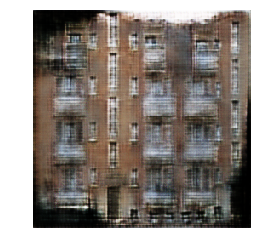

INFO:root:speed: 32.97310300478445 samples/s
INFO:root:discriminator loss = 0.340093, generator loss = 18.579441, binary training acc = 0.938367 at iter 0 epoch 40
INFO:root:speed: 14.366613232493458 samples/s
INFO:root:discriminator loss = 0.477063, generator loss = 20.739014, binary training acc = 0.835625 at iter 10 epoch 40
INFO:root:speed: 17.020217042762933 samples/s
INFO:root:discriminator loss = 0.256947, generator loss = 18.911839, binary training acc = 0.785535 at iter 20 epoch 40
INFO:root:speed: 15.204085738448505 samples/s
INFO:root:discriminator loss = 0.304757, generator loss = 20.258137, binary training acc = 0.773587 at iter 30 epoch 40
INFO:root:
binary training acc at epoch 40: facc=0.752246
INFO:root:time: 25.164472


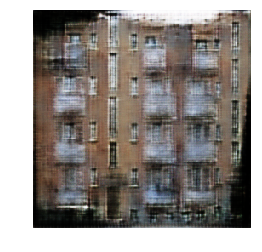

INFO:root:speed: 28.085810194128925 samples/s
INFO:root:discriminator loss = 0.332709, generator loss = 17.878544, binary training acc = 0.786327 at iter 0 epoch 41
INFO:root:speed: 14.409726719448114 samples/s
INFO:root:discriminator loss = 0.514510, generator loss = 20.746889, binary training acc = 0.808475 at iter 10 epoch 41
INFO:root:speed: 16.095642787053656 samples/s
INFO:root:discriminator loss = 0.522296, generator loss = 19.673199, binary training acc = 0.777007 at iter 20 epoch 41
INFO:root:speed: 15.269632925553738 samples/s
INFO:root:discriminator loss = 0.504771, generator loss = 21.036421, binary training acc = 0.794816 at iter 30 epoch 41
INFO:root:
binary training acc at epoch 41: facc=0.775576
INFO:root:time: 25.020955


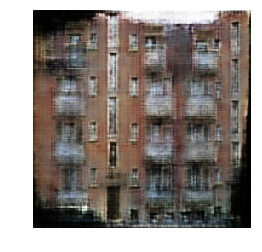

INFO:root:speed: 25.625431489014368 samples/s
INFO:root:discriminator loss = 0.372524, generator loss = 17.624201, binary training acc = 0.636816 at iter 0 epoch 42
INFO:root:speed: 14.825524634955869 samples/s
INFO:root:discriminator loss = 0.307677, generator loss = 19.738344, binary training acc = 0.739221 at iter 10 epoch 42
INFO:root:speed: 13.93254201964698 samples/s
INFO:root:discriminator loss = 0.323455, generator loss = 18.693707, binary training acc = 0.746142 at iter 20 epoch 42
INFO:root:speed: 17.221107260753175 samples/s
INFO:root:discriminator loss = 0.543347, generator loss = 21.335953, binary training acc = 0.748853 at iter 30 epoch 42
INFO:root:
binary training acc at epoch 42: facc=0.748252
INFO:root:time: 24.929350


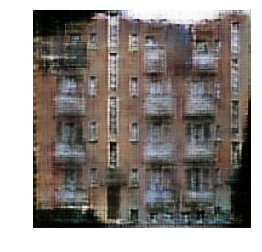

INFO:root:speed: 27.697551975371173 samples/s
INFO:root:discriminator loss = 0.437458, generator loss = 18.190090, binary training acc = 0.598041 at iter 0 epoch 43
INFO:root:speed: 14.160583695171807 samples/s
INFO:root:discriminator loss = 0.451631, generator loss = 20.455698, binary training acc = 0.732835 at iter 10 epoch 43
INFO:root:speed: 16.74949224044362 samples/s
INFO:root:discriminator loss = 0.237851, generator loss = 18.645550, binary training acc = 0.730886 at iter 20 epoch 43
INFO:root:speed: 14.921813797514918 samples/s
INFO:root:discriminator loss = 0.395929, generator loss = 20.750238, binary training acc = 0.763070 at iter 30 epoch 43
INFO:root:
binary training acc at epoch 43: facc=0.766237
INFO:root:time: 25.192060


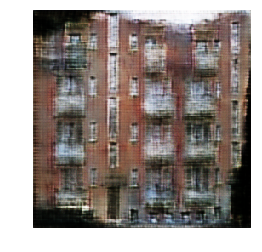

INFO:root:speed: 29.891311551933637 samples/s
INFO:root:discriminator loss = 0.403482, generator loss = 18.189449, binary training acc = 0.677061 at iter 0 epoch 44
INFO:root:speed: 14.56709110996037 samples/s
INFO:root:discriminator loss = 0.352564, generator loss = 19.687057, binary training acc = 0.766698 at iter 10 epoch 44
INFO:root:speed: 17.67803193785067 samples/s
INFO:root:discriminator loss = 0.366724, generator loss = 18.091682, binary training acc = 0.732976 at iter 20 epoch 44
INFO:root:speed: 13.57478341472003 samples/s
INFO:root:discriminator loss = 0.391267, generator loss = 20.825830, binary training acc = 0.768966 at iter 30 epoch 44
INFO:root:
binary training acc at epoch 44: facc=0.751626
INFO:root:time: 25.265861


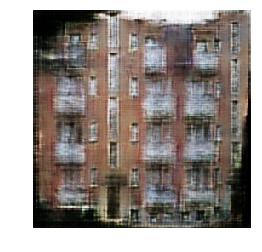

INFO:root:speed: 29.596670510050426 samples/s
INFO:root:discriminator loss = 0.457592, generator loss = 18.242260, binary training acc = 0.746245 at iter 0 epoch 45
INFO:root:speed: 13.135251972493757 samples/s
INFO:root:discriminator loss = 0.405934, generator loss = 19.699802, binary training acc = 0.823173 at iter 10 epoch 45
INFO:root:speed: 15.719271314296678 samples/s
INFO:root:discriminator loss = 0.332723, generator loss = 18.185694, binary training acc = 0.775983 at iter 20 epoch 45
INFO:root:speed: 19.752783155685766 samples/s
INFO:root:discriminator loss = 0.423611, generator loss = 20.655441, binary training acc = 0.792943 at iter 30 epoch 45
INFO:root:
binary training acc at epoch 45: facc=0.766678
INFO:root:time: 24.337803


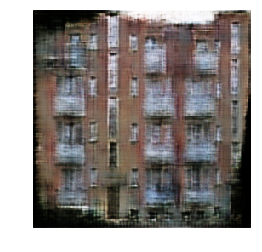

INFO:root:speed: 33.89900864305493 samples/s
INFO:root:discriminator loss = 0.407628, generator loss = 18.113352, binary training acc = 0.838082 at iter 0 epoch 46
INFO:root:speed: 13.569074328809773 samples/s
INFO:root:discriminator loss = 0.403582, generator loss = 20.139830, binary training acc = 0.790007 at iter 10 epoch 46
INFO:root:speed: 14.859402124237421 samples/s
INFO:root:discriminator loss = 0.971589, generator loss = 19.503948, binary training acc = 0.753514 at iter 20 epoch 46
INFO:root:speed: 13.884644643080591 samples/s
INFO:root:discriminator loss = 0.370377, generator loss = 20.008825, binary training acc = 0.755787 at iter 30 epoch 46
INFO:root:
binary training acc at epoch 46: facc=0.760784
INFO:root:time: 25.433977


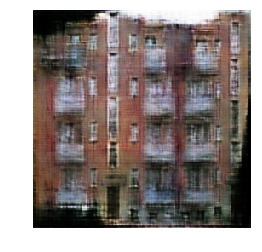

INFO:root:speed: 26.893753009618596 samples/s
INFO:root:discriminator loss = 0.365934, generator loss = 17.957180, binary training acc = 0.709347 at iter 0 epoch 47
INFO:root:speed: 14.349081626125068 samples/s
INFO:root:discriminator loss = 0.465158, generator loss = 19.389212, binary training acc = 0.772720 at iter 10 epoch 47
INFO:root:speed: 19.027508044368897 samples/s
INFO:root:discriminator loss = 0.496767, generator loss = 18.471016, binary training acc = 0.764772 at iter 20 epoch 47
INFO:root:speed: 14.252141319073617 samples/s
INFO:root:discriminator loss = 0.388066, generator loss = 20.190914, binary training acc = 0.780398 at iter 30 epoch 47
INFO:root:
binary training acc at epoch 47: facc=0.781964
INFO:root:time: 25.402024


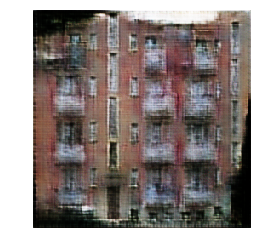

INFO:root:speed: 28.402723321726576 samples/s
INFO:root:discriminator loss = 0.319810, generator loss = 17.357561, binary training acc = 0.931592 at iter 0 epoch 48
INFO:root:speed: 16.88230497198964 samples/s
INFO:root:discriminator loss = 0.372497, generator loss = 19.139622, binary training acc = 0.770850 at iter 10 epoch 48
INFO:root:speed: 15.77679076541605 samples/s
INFO:root:discriminator loss = 0.351774, generator loss = 18.181164, binary training acc = 0.727965 at iter 20 epoch 48
INFO:root:speed: 18.01497445271777 samples/s
INFO:root:discriminator loss = 0.811268, generator loss = 21.663345, binary training acc = 0.752707 at iter 30 epoch 48
INFO:root:
binary training acc at epoch 48: facc=0.740441
INFO:root:time: 23.766369


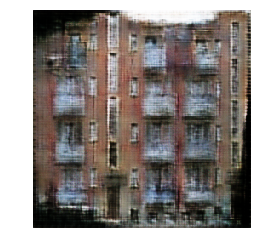

INFO:root:speed: 66.81370776457919 samples/s
INFO:root:discriminator loss = 0.362162, generator loss = 17.307894, binary training acc = 0.920449 at iter 0 epoch 49
INFO:root:speed: 16.53092505380832 samples/s
INFO:root:discriminator loss = 0.253801, generator loss = 18.995319, binary training acc = 0.874089 at iter 10 epoch 49
INFO:root:speed: 15.486485568409563 samples/s
INFO:root:discriminator loss = 0.447374, generator loss = 18.144190, binary training acc = 0.795075 at iter 20 epoch 49
INFO:root:speed: 14.174226945570723 samples/s
INFO:root:discriminator loss = 0.472837, generator loss = 20.488724, binary training acc = 0.816492 at iter 30 epoch 49
INFO:root:
binary training acc at epoch 49: facc=0.820223
INFO:root:time: 24.176344


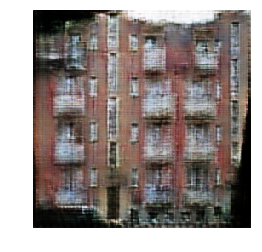

INFO:root:speed: 34.98521535534445 samples/s
INFO:root:discriminator loss = 0.386823, generator loss = 17.582256, binary training acc = 0.803061 at iter 0 epoch 50
INFO:root:speed: 15.030352374222199 samples/s
INFO:root:discriminator loss = 0.195275, generator loss = 18.582043, binary training acc = 0.785596 at iter 10 epoch 50
INFO:root:speed: 15.197744780456697 samples/s
INFO:root:discriminator loss = 0.486595, generator loss = 18.679768, binary training acc = 0.766501 at iter 20 epoch 50
INFO:root:speed: 13.922321466803114 samples/s
INFO:root:discriminator loss = 0.404949, generator loss = 19.891109, binary training acc = 0.762560 at iter 30 epoch 50
INFO:root:
binary training acc at epoch 50: facc=0.765401
INFO:root:time: 24.965490


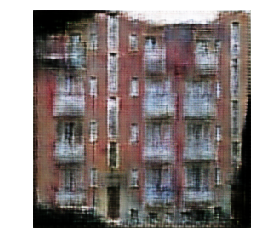

INFO:root:speed: 39.31812280351456 samples/s
INFO:root:discriminator loss = 0.409964, generator loss = 16.932213, binary training acc = 0.718490 at iter 0 epoch 51
INFO:root:speed: 15.888766993763145 samples/s
INFO:root:discriminator loss = 0.246560, generator loss = 18.582569, binary training acc = 0.793751 at iter 10 epoch 51
INFO:root:speed: 16.284176724477646 samples/s
INFO:root:discriminator loss = 0.449688, generator loss = 17.771235, binary training acc = 0.742313 at iter 20 epoch 51
INFO:root:speed: 15.31418456599811 samples/s
INFO:root:discriminator loss = 0.328855, generator loss = 19.417297, binary training acc = 0.774678 at iter 30 epoch 51
INFO:root:
binary training acc at epoch 51: facc=0.757982
INFO:root:time: 25.331194


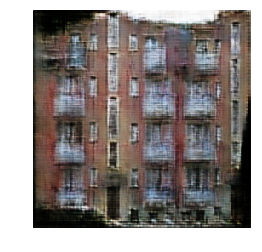

INFO:root:speed: 27.546750224778062 samples/s
INFO:root:discriminator loss = 0.663444, generator loss = 16.462622, binary training acc = 0.505510 at iter 0 epoch 52
INFO:root:speed: 17.285834391124446 samples/s
INFO:root:discriminator loss = 0.615731, generator loss = 19.579046, binary training acc = 0.738894 at iter 10 epoch 52
INFO:root:speed: 17.176507974989804 samples/s
INFO:root:discriminator loss = 0.407494, generator loss = 18.343142, binary training acc = 0.726781 at iter 20 epoch 52
INFO:root:speed: 17.034671206750343 samples/s
INFO:root:discriminator loss = 0.309528, generator loss = 19.377211, binary training acc = 0.765795 at iter 30 epoch 52
INFO:root:
binary training acc at epoch 52: facc=0.742815
INFO:root:time: 24.681602


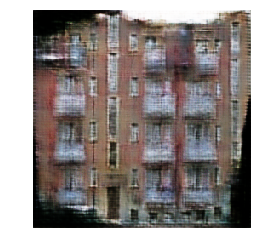

INFO:root:speed: 25.92206392409601 samples/s
INFO:root:discriminator loss = 0.375442, generator loss = 16.597305, binary training acc = 0.697673 at iter 0 epoch 53
INFO:root:speed: 17.246649092313874 samples/s
INFO:root:discriminator loss = 0.444620, generator loss = 18.406773, binary training acc = 0.769106 at iter 10 epoch 53
INFO:root:speed: 19.44612691271297 samples/s
INFO:root:discriminator loss = 0.256722, generator loss = 17.051479, binary training acc = 0.766523 at iter 20 epoch 53
INFO:root:speed: 16.414392273193336 samples/s
INFO:root:discriminator loss = 0.398688, generator loss = 19.972555, binary training acc = 0.789057 at iter 30 epoch 53
INFO:root:
binary training acc at epoch 53: facc=0.771396
INFO:root:time: 24.977381


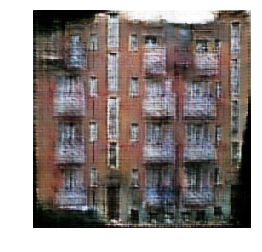

INFO:root:speed: 33.70548650833576 samples/s
INFO:root:discriminator loss = 0.325930, generator loss = 16.861736, binary training acc = 0.855184 at iter 0 epoch 54
INFO:root:speed: 17.82019645831209 samples/s
INFO:root:discriminator loss = 0.209892, generator loss = 18.021202, binary training acc = 0.848000 at iter 10 epoch 54
INFO:root:speed: 18.185185827509063 samples/s
INFO:root:discriminator loss = 0.946456, generator loss = 18.986103, binary training acc = 0.779707 at iter 20 epoch 54
INFO:root:speed: 14.418757189089291 samples/s
INFO:root:discriminator loss = 0.653603, generator loss = 20.395880, binary training acc = 0.772194 at iter 30 epoch 54
INFO:root:
binary training acc at epoch 54: facc=0.758820
INFO:root:time: 25.160456


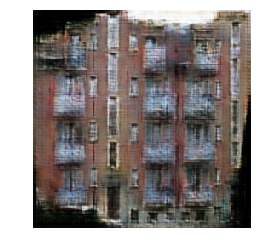

INFO:root:speed: 32.244728515066434 samples/s
INFO:root:discriminator loss = 0.479751, generator loss = 16.489412, binary training acc = 0.579551 at iter 0 epoch 55
INFO:root:speed: 12.903117042846995 samples/s
INFO:root:discriminator loss = 0.374173, generator loss = 18.546360, binary training acc = 0.737933 at iter 10 epoch 55
INFO:root:speed: 15.585608918751502 samples/s
INFO:root:discriminator loss = 0.294067, generator loss = 16.755749, binary training acc = 0.723611 at iter 20 epoch 55
INFO:root:speed: 17.2280676388825 samples/s
INFO:root:discriminator loss = 0.419216, generator loss = 19.273531, binary training acc = 0.738092 at iter 30 epoch 55
INFO:root:
binary training acc at epoch 55: facc=0.752338
INFO:root:time: 23.871095


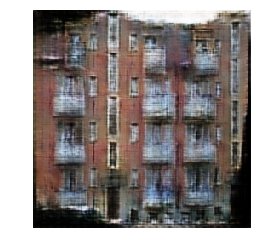

INFO:root:speed: 30.342123519807398 samples/s
INFO:root:discriminator loss = 0.436919, generator loss = 16.435877, binary training acc = 0.628612 at iter 0 epoch 56
INFO:root:speed: 16.428272912039123 samples/s
INFO:root:discriminator loss = 0.169663, generator loss = 17.801878, binary training acc = 0.821718 at iter 10 epoch 56
INFO:root:speed: 14.51923156807413 samples/s
INFO:root:discriminator loss = 0.244831, generator loss = 16.732210, binary training acc = 0.783223 at iter 20 epoch 56
INFO:root:speed: 14.270907797359632 samples/s
INFO:root:discriminator loss = 0.429848, generator loss = 18.976963, binary training acc = 0.774238 at iter 30 epoch 56
INFO:root:
binary training acc at epoch 56: facc=0.749459
INFO:root:time: 25.544658


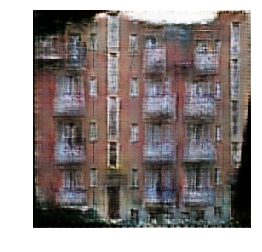

INFO:root:speed: 27.613434667425093 samples/s
INFO:root:discriminator loss = 0.544981, generator loss = 16.627129, binary training acc = 0.651918 at iter 0 epoch 57
INFO:root:speed: 15.210641600301726 samples/s
INFO:root:discriminator loss = 0.383060, generator loss = 18.311827, binary training acc = 0.717614 at iter 10 epoch 57
INFO:root:speed: 14.924877512074433 samples/s
INFO:root:discriminator loss = 0.298722, generator loss = 16.586828, binary training acc = 0.750964 at iter 20 epoch 57
INFO:root:speed: 16.068215626413863 samples/s
INFO:root:discriminator loss = 0.419300, generator loss = 19.460951, binary training acc = 0.782744 at iter 30 epoch 57
INFO:root:
binary training acc at epoch 57: facc=0.770884
INFO:root:time: 25.093393


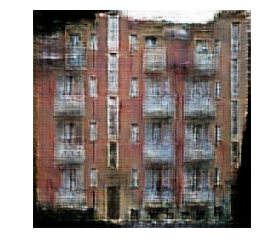

INFO:root:speed: 27.33316346380052 samples/s
INFO:root:discriminator loss = 0.387994, generator loss = 16.852936, binary training acc = 0.701673 at iter 0 epoch 58
INFO:root:speed: 16.371535889278046 samples/s
INFO:root:discriminator loss = 0.527852, generator loss = 18.189030, binary training acc = 0.733165 at iter 10 epoch 58
INFO:root:speed: 16.51517955510685 samples/s
INFO:root:discriminator loss = 0.437729, generator loss = 17.009031, binary training acc = 0.747364 at iter 20 epoch 58
INFO:root:speed: 15.01660335017119 samples/s
INFO:root:discriminator loss = 0.439840, generator loss = 19.605379, binary training acc = 0.763658 at iter 30 epoch 58
INFO:root:
binary training acc at epoch 58: facc=0.751591
INFO:root:time: 24.525167


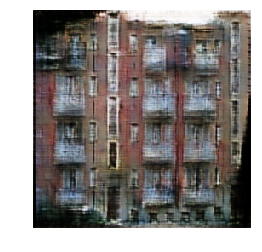

INFO:root:speed: 27.2372789891377 samples/s
INFO:root:discriminator loss = 0.330027, generator loss = 16.509106, binary training acc = 0.881755 at iter 0 epoch 59
INFO:root:speed: 17.53570540143361 samples/s
INFO:root:discriminator loss = 0.433022, generator loss = 18.933582, binary training acc = 0.758531 at iter 10 epoch 59
INFO:root:speed: 13.156491618128042 samples/s
INFO:root:discriminator loss = 0.423148, generator loss = 16.560442, binary training acc = 0.734016 at iter 20 epoch 59
INFO:root:speed: 14.838348371667673 samples/s
INFO:root:discriminator loss = 0.384524, generator loss = 19.371988, binary training acc = 0.747899 at iter 30 epoch 59
INFO:root:
binary training acc at epoch 59: facc=0.740665
INFO:root:time: 25.394850


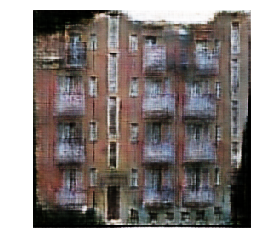

INFO:root:speed: 41.38737312837839 samples/s
INFO:root:discriminator loss = 0.412956, generator loss = 17.037630, binary training acc = 0.709918 at iter 0 epoch 60
INFO:root:speed: 16.720313429337278 samples/s
INFO:root:discriminator loss = 0.422631, generator loss = 18.321915, binary training acc = 0.825020 at iter 10 epoch 60
INFO:root:speed: 13.790406925609862 samples/s
INFO:root:discriminator loss = 0.248105, generator loss = 16.163502, binary training acc = 0.759456 at iter 20 epoch 60
INFO:root:speed: 17.500285808939434 samples/s
INFO:root:discriminator loss = 0.385880, generator loss = 18.665752, binary training acc = 0.770565 at iter 30 epoch 60
INFO:root:
binary training acc at epoch 60: facc=0.760381
INFO:root:time: 24.441855


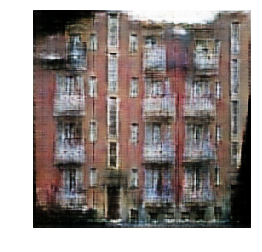

INFO:root:speed: 27.963872282237293 samples/s
INFO:root:discriminator loss = 0.356935, generator loss = 16.629856, binary training acc = 0.900245 at iter 0 epoch 61
INFO:root:speed: 16.906850970501416 samples/s
INFO:root:discriminator loss = 0.484023, generator loss = 18.360947, binary training acc = 0.797551 at iter 10 epoch 61
INFO:root:speed: 17.368070822140904 samples/s
INFO:root:discriminator loss = 0.559983, generator loss = 16.483929, binary training acc = 0.739273 at iter 20 epoch 61
INFO:root:speed: 14.702911589464449 samples/s
INFO:root:discriminator loss = 0.444488, generator loss = 18.483824, binary training acc = 0.768437 at iter 30 epoch 61
INFO:root:
binary training acc at epoch 61: facc=0.770077
INFO:root:time: 23.531390


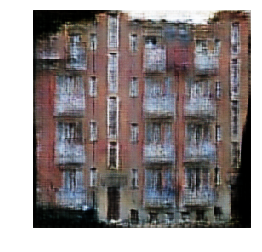

INFO:root:speed: 26.591787321696096 samples/s
INFO:root:discriminator loss = 0.351950, generator loss = 16.764668, binary training acc = 0.866449 at iter 0 epoch 62
INFO:root:speed: 14.2365740745455 samples/s
INFO:root:discriminator loss = 0.462623, generator loss = 18.297449, binary training acc = 0.689310 at iter 10 epoch 62
INFO:root:speed: 19.925557735035895 samples/s
INFO:root:discriminator loss = 0.286080, generator loss = 16.430317, binary training acc = 0.719250 at iter 20 epoch 62
INFO:root:speed: 15.042610467664318 samples/s
INFO:root:discriminator loss = 0.362523, generator loss = 18.576084, binary training acc = 0.744105 at iter 30 epoch 62
INFO:root:
binary training acc at epoch 62: facc=0.740089
INFO:root:time: 25.215047


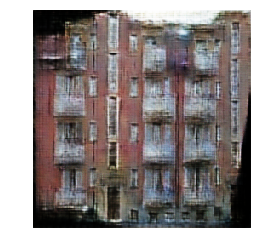

INFO:root:speed: 29.212049201393217 samples/s
INFO:root:discriminator loss = 0.426208, generator loss = 15.925196, binary training acc = 0.695224 at iter 0 epoch 63
INFO:root:speed: 14.227224945837685 samples/s
INFO:root:discriminator loss = 0.284927, generator loss = 17.660118, binary training acc = 0.776594 at iter 10 epoch 63
INFO:root:speed: 15.366002344665885 samples/s
INFO:root:discriminator loss = 0.430696, generator loss = 16.551136, binary training acc = 0.723034 at iter 20 epoch 63
INFO:root:speed: 15.537112077284307 samples/s
INFO:root:discriminator loss = 0.534272, generator loss = 18.829428, binary training acc = 0.750515 at iter 30 epoch 63
INFO:root:
binary training acc at epoch 63: facc=0.742882
INFO:root:time: 25.474323


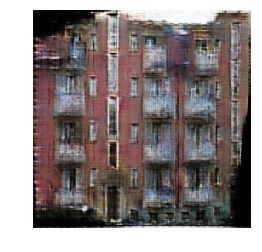

INFO:root:speed: 25.78698079335022 samples/s
INFO:root:discriminator loss = 0.366683, generator loss = 15.846100, binary training acc = 0.864041 at iter 0 epoch 64
INFO:root:speed: 13.654626789191294 samples/s
INFO:root:discriminator loss = 0.308155, generator loss = 17.403605, binary training acc = 0.844664 at iter 10 epoch 64
INFO:root:speed: 16.6131906461128 samples/s
INFO:root:discriminator loss = 0.418798, generator loss = 16.231205, binary training acc = 0.790805 at iter 20 epoch 64
INFO:root:speed: 17.463474671469815 samples/s
INFO:root:discriminator loss = 0.623705, generator loss = 18.635950, binary training acc = 0.781232 at iter 30 epoch 64
INFO:root:
binary training acc at epoch 64: facc=0.743734
INFO:root:time: 25.076466


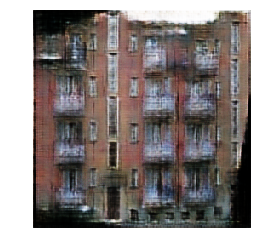

INFO:root:speed: 26.835628016310068 samples/s
INFO:root:discriminator loss = 0.663236, generator loss = 16.913189, binary training acc = 0.680735 at iter 0 epoch 65
INFO:root:speed: 16.07544563585584 samples/s
INFO:root:discriminator loss = 0.332449, generator loss = 17.464064, binary training acc = 0.770438 at iter 10 epoch 65
INFO:root:speed: 16.366227300041363 samples/s
INFO:root:discriminator loss = 0.324173, generator loss = 15.917114, binary training acc = 0.759374 at iter 20 epoch 65
INFO:root:speed: 14.78907873608732 samples/s
INFO:root:discriminator loss = 0.752753, generator loss = 19.503054, binary training acc = 0.768406 at iter 30 epoch 65
INFO:root:
binary training acc at epoch 65: facc=0.754390
INFO:root:time: 25.370622


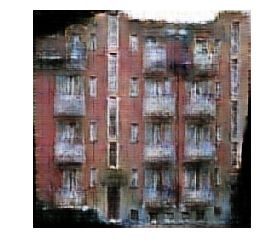

INFO:root:speed: 31.146346027606405 samples/s
INFO:root:discriminator loss = 0.380489, generator loss = 15.606290, binary training acc = 0.689469 at iter 0 epoch 66
INFO:root:speed: 16.59523924454007 samples/s
INFO:root:discriminator loss = 0.546975, generator loss = 18.314966, binary training acc = 0.760267 at iter 10 epoch 66
INFO:root:speed: 15.71228155087035 samples/s
INFO:root:discriminator loss = 0.409573, generator loss = 16.435389, binary training acc = 0.717444 at iter 20 epoch 66
INFO:root:speed: 16.627759050550036 samples/s
INFO:root:discriminator loss = 0.448397, generator loss = 18.109884, binary training acc = 0.763392 at iter 30 epoch 66
INFO:root:
binary training acc at epoch 66: facc=0.751961
INFO:root:time: 25.315951


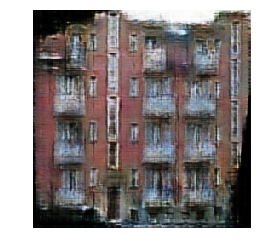

INFO:root:speed: 36.219741350724 samples/s
INFO:root:discriminator loss = 0.296773, generator loss = 15.463324, binary training acc = 0.906082 at iter 0 epoch 67
INFO:root:speed: 15.874725174073767 samples/s
INFO:root:discriminator loss = 0.357078, generator loss = 17.776619, binary training acc = 0.795978 at iter 10 epoch 67
INFO:root:speed: 15.272279471924747 samples/s
INFO:root:discriminator loss = 0.478111, generator loss = 17.124954, binary training acc = 0.741079 at iter 20 epoch 67
INFO:root:speed: 15.660380317292004 samples/s
INFO:root:discriminator loss = 0.489523, generator loss = 18.512428, binary training acc = 0.722824 at iter 30 epoch 67
INFO:root:
binary training acc at epoch 67: facc=0.733900
INFO:root:time: 25.254094


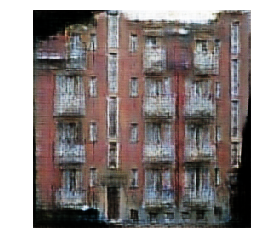

INFO:root:speed: 25.56768147684415 samples/s
INFO:root:discriminator loss = 0.375067, generator loss = 15.472284, binary training acc = 0.912041 at iter 0 epoch 68
INFO:root:speed: 17.266450515485985 samples/s
INFO:root:discriminator loss = 0.281263, generator loss = 17.418098, binary training acc = 0.761970 at iter 10 epoch 68
INFO:root:speed: 16.047313570628123 samples/s
INFO:root:discriminator loss = 0.316858, generator loss = 16.185385, binary training acc = 0.769442 at iter 20 epoch 68
INFO:root:speed: 14.651909623063801 samples/s
INFO:root:discriminator loss = 0.446985, generator loss = 18.500568, binary training acc = 0.791476 at iter 30 epoch 68
INFO:root:
binary training acc at epoch 68: facc=0.786435
INFO:root:time: 25.434043


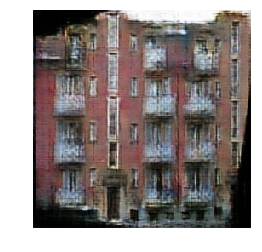

INFO:root:speed: 31.175237625204772 samples/s
INFO:root:discriminator loss = 0.372003, generator loss = 15.401201, binary training acc = 0.788041 at iter 0 epoch 69
INFO:root:speed: 14.559339413517058 samples/s
INFO:root:discriminator loss = 0.233510, generator loss = 16.607800, binary training acc = 0.728282 at iter 10 epoch 69
INFO:root:speed: 17.102156982670746 samples/s
INFO:root:discriminator loss = 0.501503, generator loss = 15.641141, binary training acc = 0.725168 at iter 20 epoch 69
INFO:root:speed: 18.807112824185072 samples/s
INFO:root:discriminator loss = 0.298507, generator loss = 17.896528, binary training acc = 0.741774 at iter 30 epoch 69
INFO:root:
binary training acc at epoch 69: facc=0.751012
INFO:root:time: 25.081569


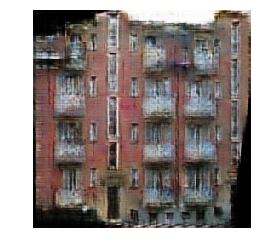

INFO:root:speed: 30.734008885397714 samples/s
INFO:root:discriminator loss = 0.370478, generator loss = 15.384811, binary training acc = 0.727633 at iter 0 epoch 70
INFO:root:speed: 15.153938257054886 samples/s
INFO:root:discriminator loss = 0.349555, generator loss = 16.873091, binary training acc = 0.749477 at iter 10 epoch 70
INFO:root:speed: 13.849182960730143 samples/s
INFO:root:discriminator loss = 0.527216, generator loss = 16.350800, binary training acc = 0.732169 at iter 20 epoch 70
INFO:root:speed: 14.63999871551525 samples/s
INFO:root:discriminator loss = 0.370959, generator loss = 17.880985, binary training acc = 0.737020 at iter 30 epoch 70
INFO:root:
binary training acc at epoch 70: facc=0.706368
INFO:root:time: 25.443157


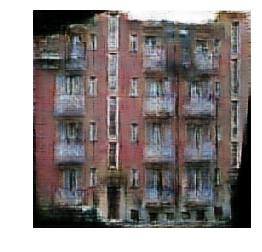

INFO:root:speed: 26.93951060224775 samples/s
INFO:root:discriminator loss = 0.446262, generator loss = 14.753462, binary training acc = 0.613469 at iter 0 epoch 71
INFO:root:speed: 14.446175364684382 samples/s
INFO:root:discriminator loss = 0.346005, generator loss = 17.140383, binary training acc = 0.798445 at iter 10 epoch 71
INFO:root:speed: 15.19443041679859 samples/s
INFO:root:discriminator loss = 0.582495, generator loss = 17.053120, binary training acc = 0.740255 at iter 20 epoch 71
INFO:root:speed: 16.47861687085339 samples/s
INFO:root:discriminator loss = 0.701720, generator loss = 18.726309, binary training acc = 0.747440 at iter 30 epoch 71
INFO:root:
binary training acc at epoch 71: facc=0.753640
INFO:root:time: 25.268619


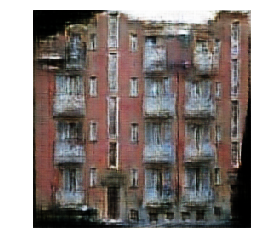

INFO:root:speed: 29.768054535324822 samples/s
INFO:root:discriminator loss = 0.416836, generator loss = 15.764804, binary training acc = 0.887510 at iter 0 epoch 72
INFO:root:speed: 16.861679525077015 samples/s
INFO:root:discriminator loss = 0.339522, generator loss = 16.726349, binary training acc = 0.843829 at iter 10 epoch 72
INFO:root:speed: 14.947626514611546 samples/s
INFO:root:discriminator loss = 0.477855, generator loss = 15.997696, binary training acc = 0.770350 at iter 20 epoch 72
INFO:root:speed: 16.490641629758063 samples/s
INFO:root:discriminator loss = 0.984200, generator loss = 18.672794, binary training acc = 0.786549 at iter 30 epoch 72
INFO:root:
binary training acc at epoch 72: facc=0.786277
INFO:root:time: 25.065691


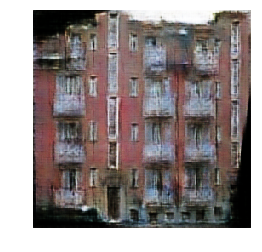

INFO:root:speed: 31.018117734584322 samples/s
INFO:root:discriminator loss = 0.320386, generator loss = 15.108502, binary training acc = 0.900327 at iter 0 epoch 73
INFO:root:speed: 17.385809747368587 samples/s
INFO:root:discriminator loss = 0.180349, generator loss = 15.884344, binary training acc = 0.800345 at iter 10 epoch 73
INFO:root:speed: 42.48631247765173 samples/s
INFO:root:discriminator loss = 0.385174, generator loss = 15.853793, binary training acc = 0.784311 at iter 20 epoch 73
INFO:root:speed: 16.182646160874093 samples/s
INFO:root:discriminator loss = 0.551163, generator loss = 18.004587, binary training acc = 0.758507 at iter 30 epoch 73
INFO:root:
binary training acc at epoch 73: facc=0.758358
INFO:root:time: 23.418263


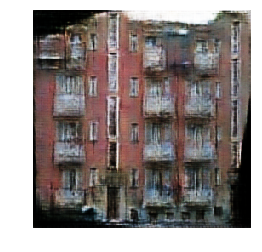

INFO:root:speed: 27.64557696237073 samples/s
INFO:root:discriminator loss = 0.506346, generator loss = 15.947159, binary training acc = 0.698449 at iter 0 epoch 74
INFO:root:speed: 15.445060958275581 samples/s
INFO:root:discriminator loss = 0.333605, generator loss = 16.553076, binary training acc = 0.780590 at iter 10 epoch 74
INFO:root:speed: 16.7134774822736 samples/s
INFO:root:discriminator loss = 0.408502, generator loss = 15.319885, binary training acc = 0.761464 at iter 20 epoch 74
INFO:root:speed: 17.65858419069215 samples/s
INFO:root:discriminator loss = 0.540201, generator loss = 18.073898, binary training acc = 0.760099 at iter 30 epoch 74
INFO:root:
binary training acc at epoch 74: facc=0.756766
INFO:root:time: 25.358818


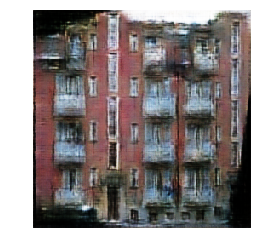

INFO:root:speed: 27.692906996474925 samples/s
INFO:root:discriminator loss = 0.359609, generator loss = 15.016367, binary training acc = 0.799510 at iter 0 epoch 75
INFO:root:speed: 16.612907697706603 samples/s
INFO:root:discriminator loss = 0.267195, generator loss = 16.033947, binary training acc = 0.867265 at iter 10 epoch 75
INFO:root:speed: 14.085953688311251 samples/s
INFO:root:discriminator loss = 0.480063, generator loss = 15.290222, binary training acc = 0.788702 at iter 20 epoch 75
INFO:root:speed: 15.912432574341791 samples/s
INFO:root:discriminator loss = 0.392219, generator loss = 17.247793, binary training acc = 0.787652 at iter 30 epoch 75
INFO:root:
binary training acc at epoch 75: facc=0.771753
INFO:root:time: 25.058603


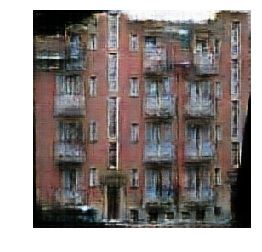

INFO:root:speed: 28.358459018100366 samples/s
INFO:root:discriminator loss = 0.389787, generator loss = 15.247867, binary training acc = 0.758694 at iter 0 epoch 76
INFO:root:speed: 17.382372882479803 samples/s
INFO:root:discriminator loss = 0.252176, generator loss = 16.157406, binary training acc = 0.826145 at iter 10 epoch 76
INFO:root:speed: 16.597169900914874 samples/s
INFO:root:discriminator loss = 0.374498, generator loss = 15.058492, binary training acc = 0.773656 at iter 20 epoch 76
INFO:root:speed: 15.19189882073917 samples/s
INFO:root:discriminator loss = 0.709708, generator loss = 18.725605, binary training acc = 0.787402 at iter 30 epoch 76
INFO:root:
binary training acc at epoch 76: facc=0.760035
INFO:root:time: 25.041297


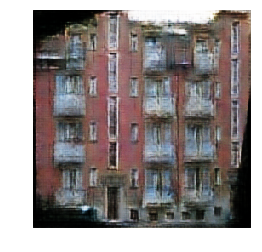

INFO:root:speed: 27.994724504888378 samples/s
INFO:root:discriminator loss = 0.386139, generator loss = 15.088690, binary training acc = 0.911347 at iter 0 epoch 77
INFO:root:speed: 14.759420236816279 samples/s
INFO:root:discriminator loss = 0.506135, generator loss = 16.253969, binary training acc = 0.763592 at iter 10 epoch 77
INFO:root:speed: 15.019813687594763 samples/s
INFO:root:discriminator loss = 0.350076, generator loss = 15.113098, binary training acc = 0.776904 at iter 20 epoch 77
INFO:root:speed: 18.081639972961415 samples/s
INFO:root:discriminator loss = 0.630628, generator loss = 17.968227, binary training acc = 0.780747 at iter 30 epoch 77
INFO:root:
binary training acc at epoch 77: facc=0.782592
INFO:root:time: 25.251714


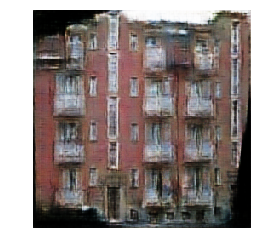

INFO:root:speed: 25.942698871877468 samples/s
INFO:root:discriminator loss = 0.241483, generator loss = 14.669973, binary training acc = 0.917347 at iter 0 epoch 78
INFO:root:speed: 15.179209536803477 samples/s
INFO:root:discriminator loss = 0.495327, generator loss = 16.187817, binary training acc = 0.737165 at iter 10 epoch 78
INFO:root:speed: 14.063382565016635 samples/s
INFO:root:discriminator loss = 0.407747, generator loss = 15.024219, binary training acc = 0.717747 at iter 20 epoch 78
INFO:root:speed: 14.816207912072851 samples/s
INFO:root:discriminator loss = 0.395144, generator loss = 16.906837, binary training acc = 0.778649 at iter 30 epoch 78
INFO:root:
binary training acc at epoch 78: facc=0.761786
INFO:root:time: 25.480313


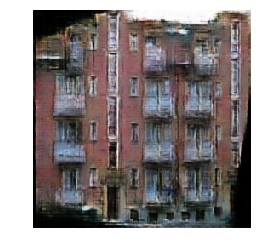

INFO:root:speed: 35.00098052387513 samples/s
INFO:root:discriminator loss = 0.593585, generator loss = 15.299635, binary training acc = 0.512816 at iter 0 epoch 79
INFO:root:speed: 13.97778912330889 samples/s
INFO:root:discriminator loss = 0.294616, generator loss = 16.137886, binary training acc = 0.782404 at iter 10 epoch 79
INFO:root:speed: 18.1754615253281 samples/s
INFO:root:discriminator loss = 0.469994, generator loss = 15.041946, binary training acc = 0.736573 at iter 20 epoch 79
INFO:root:speed: 17.64597684901204 samples/s
INFO:root:discriminator loss = 0.310432, generator loss = 16.767445, binary training acc = 0.739812 at iter 30 epoch 79
INFO:root:
binary training acc at epoch 79: facc=0.752104
INFO:root:time: 24.985024


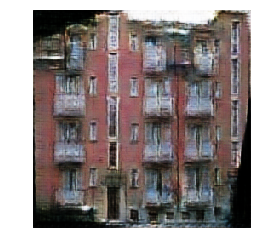

INFO:root:speed: 27.073545112204418 samples/s
INFO:root:discriminator loss = 0.411890, generator loss = 15.185343, binary training acc = 0.926367 at iter 0 epoch 80
INFO:root:speed: 17.114816014781166 samples/s
INFO:root:discriminator loss = 0.245987, generator loss = 15.664696, binary training acc = 0.782946 at iter 10 epoch 80
INFO:root:speed: 19.718312772582156 samples/s
INFO:root:discriminator loss = 0.696279, generator loss = 15.209109, binary training acc = 0.710655 at iter 20 epoch 80
INFO:root:speed: 16.888987318070996 samples/s
INFO:root:discriminator loss = 0.456964, generator loss = 17.077944, binary training acc = 0.743616 at iter 30 epoch 80
INFO:root:
binary training acc at epoch 80: facc=0.748405
INFO:root:time: 24.747895


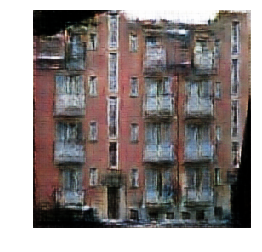

INFO:root:speed: 37.680744863967455 samples/s
INFO:root:discriminator loss = 0.422207, generator loss = 15.610329, binary training acc = 0.788980 at iter 0 epoch 81
INFO:root:speed: 14.656942672933447 samples/s
INFO:root:discriminator loss = 0.197850, generator loss = 15.517779, binary training acc = 0.789295 at iter 10 epoch 81
INFO:root:speed: 17.266642433094553 samples/s
INFO:root:discriminator loss = 0.445961, generator loss = 15.285054, binary training acc = 0.776257 at iter 20 epoch 81
INFO:root:speed: 15.015017509091052 samples/s
INFO:root:discriminator loss = 0.297974, generator loss = 16.334179, binary training acc = 0.793685 at iter 30 epoch 81
INFO:root:
binary training acc at epoch 81: facc=0.767323
INFO:root:time: 25.487954


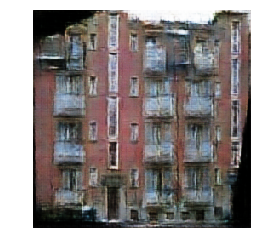

INFO:root:speed: 31.28065378838389 samples/s
INFO:root:discriminator loss = 0.460791, generator loss = 14.924332, binary training acc = 0.819510 at iter 0 epoch 82
INFO:root:speed: 14.008675798476725 samples/s
INFO:root:discriminator loss = 0.351229, generator loss = 15.693964, binary training acc = 0.752022 at iter 10 epoch 82
INFO:root:speed: 14.164318500487644 samples/s
INFO:root:discriminator loss = 0.477460, generator loss = 14.601267, binary training acc = 0.763753 at iter 20 epoch 82
INFO:root:speed: 14.874779323782105 samples/s
INFO:root:discriminator loss = 0.430758, generator loss = 16.253115, binary training acc = 0.777584 at iter 30 epoch 82
INFO:root:
binary training acc at epoch 82: facc=0.764687
INFO:root:time: 25.498701


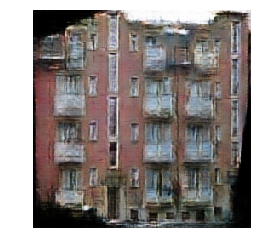

INFO:root:speed: 26.24975513895278 samples/s
INFO:root:discriminator loss = 0.318975, generator loss = 14.608607, binary training acc = 0.809102 at iter 0 epoch 83
INFO:root:speed: 15.864169583775391 samples/s
INFO:root:discriminator loss = 0.239362, generator loss = 15.682726, binary training acc = 0.804059 at iter 10 epoch 83
INFO:root:speed: 17.389579612299354 samples/s
INFO:root:discriminator loss = 0.923032, generator loss = 16.047232, binary training acc = 0.787850 at iter 20 epoch 83
INFO:root:speed: 15.14732723583842 samples/s
INFO:root:discriminator loss = 0.591544, generator loss = 16.859207, binary training acc = 0.767825 at iter 30 epoch 83
INFO:root:
binary training acc at epoch 83: facc=0.766587
INFO:root:time: 25.120561


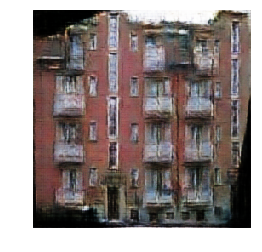

INFO:root:speed: 28.22690797106716 samples/s
INFO:root:discriminator loss = 0.505339, generator loss = 15.430471, binary training acc = 0.827469 at iter 0 epoch 84
INFO:root:speed: 15.723685073741137 samples/s
INFO:root:discriminator loss = 0.422226, generator loss = 16.582241, binary training acc = 0.813354 at iter 10 epoch 84
INFO:root:speed: 16.86024257855383 samples/s
INFO:root:discriminator loss = 0.371764, generator loss = 14.599162, binary training acc = 0.771092 at iter 20 epoch 84
INFO:root:speed: 14.022009013686347 samples/s
INFO:root:discriminator loss = 0.365291, generator loss = 16.156282, binary training acc = 0.788512 at iter 30 epoch 84
INFO:root:
binary training acc at epoch 84: facc=0.752433
INFO:root:time: 25.414781


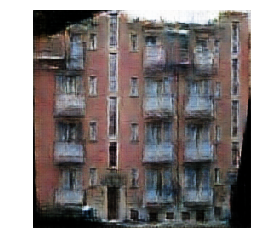

INFO:root:speed: 26.91047302282669 samples/s
INFO:root:discriminator loss = 0.395625, generator loss = 14.485085, binary training acc = 0.834653 at iter 0 epoch 85
INFO:root:speed: 15.718947304118599 samples/s
INFO:root:discriminator loss = 0.345410, generator loss = 15.648506, binary training acc = 0.836364 at iter 10 epoch 85
INFO:root:speed: 16.30090359689862 samples/s
INFO:root:discriminator loss = 0.457464, generator loss = 14.476988, binary training acc = 0.786379 at iter 20 epoch 85
INFO:root:speed: 14.666013958627635 samples/s
INFO:root:discriminator loss = 0.481848, generator loss = 16.916462, binary training acc = 0.806404 at iter 30 epoch 85
INFO:root:
binary training acc at epoch 85: facc=0.797453
INFO:root:time: 23.103891


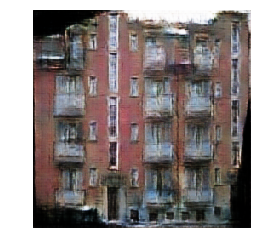

INFO:root:speed: 29.13390902321653 samples/s
INFO:root:discriminator loss = 0.380639, generator loss = 14.366208, binary training acc = 0.666816 at iter 0 epoch 86
INFO:root:speed: 15.059639966407302 samples/s
INFO:root:discriminator loss = 0.449542, generator loss = 16.144754, binary training acc = 0.722746 at iter 10 epoch 86
INFO:root:speed: 17.811334984676314 samples/s
INFO:root:discriminator loss = 0.523504, generator loss = 15.101918, binary training acc = 0.701481 at iter 20 epoch 86
INFO:root:speed: 14.969119951634045 samples/s
INFO:root:discriminator loss = 0.425624, generator loss = 16.425543, binary training acc = 0.740232 at iter 30 epoch 86
INFO:root:
binary training acc at epoch 86: facc=0.740557
INFO:root:time: 24.966338


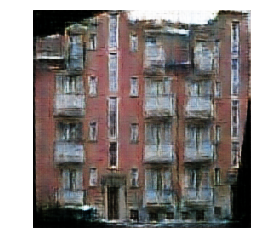

INFO:root:speed: 30.54534861703832 samples/s
INFO:root:discriminator loss = 0.409073, generator loss = 13.882718, binary training acc = 0.717061 at iter 0 epoch 87
INFO:root:speed: 14.546534090317927 samples/s
INFO:root:discriminator loss = 0.272743, generator loss = 15.626646, binary training acc = 0.700761 at iter 10 epoch 87
INFO:root:speed: 19.163895170034117 samples/s
INFO:root:discriminator loss = 0.383164, generator loss = 14.801132, binary training acc = 0.742410 at iter 20 epoch 87
INFO:root:speed: 15.106214852863742 samples/s
INFO:root:discriminator loss = 0.288398, generator loss = 16.044697, binary training acc = 0.761806 at iter 30 epoch 87
INFO:root:
binary training acc at epoch 87: facc=0.747864
INFO:root:time: 24.981558


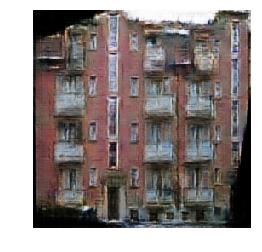

INFO:root:speed: 27.086220803215497 samples/s
INFO:root:discriminator loss = 0.410455, generator loss = 14.173793, binary training acc = 0.857020 at iter 0 epoch 88
INFO:root:speed: 16.384473613690396 samples/s
INFO:root:discriminator loss = 0.309623, generator loss = 15.122571, binary training acc = 0.764260 at iter 10 epoch 88
INFO:root:speed: 16.41944290683718 samples/s
INFO:root:discriminator loss = 0.577456, generator loss = 14.757471, binary training acc = 0.749061 at iter 20 epoch 88
INFO:root:speed: 15.569259437297813 samples/s
INFO:root:discriminator loss = 0.341356, generator loss = 16.370897, binary training acc = 0.762679 at iter 30 epoch 88
INFO:root:
binary training acc at epoch 88: facc=0.757260
INFO:root:time: 25.419145


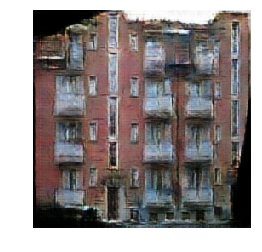

INFO:root:speed: 29.16804765577244 samples/s
INFO:root:discriminator loss = 0.711678, generator loss = 15.414844, binary training acc = 0.628939 at iter 0 epoch 89
INFO:root:speed: 14.388357321338644 samples/s
INFO:root:discriminator loss = 0.378825, generator loss = 15.145886, binary training acc = 0.766846 at iter 10 epoch 89
INFO:root:speed: 15.271595507548952 samples/s
INFO:root:discriminator loss = 0.422556, generator loss = 14.561934, binary training acc = 0.755248 at iter 20 epoch 89
INFO:root:speed: 17.330753329027818 samples/s
INFO:root:discriminator loss = 0.452061, generator loss = 16.917242, binary training acc = 0.771859 at iter 30 epoch 89
INFO:root:
binary training acc at epoch 89: facc=0.747688
INFO:root:time: 25.121426


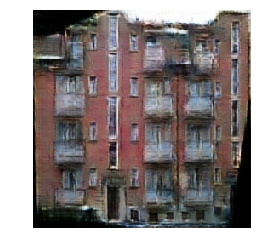

INFO:root:speed: 29.064924283529475 samples/s
INFO:root:discriminator loss = 0.427865, generator loss = 14.115076, binary training acc = 0.663592 at iter 0 epoch 90
INFO:root:speed: 17.29623448596092 samples/s
INFO:root:discriminator loss = 0.309563, generator loss = 15.129507, binary training acc = 0.763165 at iter 10 epoch 90
INFO:root:speed: 16.601939364960494 samples/s
INFO:root:discriminator loss = 0.431015, generator loss = 14.728891, binary training acc = 0.755077 at iter 20 epoch 90
INFO:root:speed: 16.889653803299325 samples/s
INFO:root:discriminator loss = 0.441497, generator loss = 16.605145, binary training acc = 0.780488 at iter 30 epoch 90
INFO:root:
binary training acc at epoch 90: facc=0.775732
INFO:root:time: 24.919584


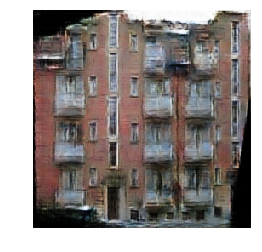

INFO:root:speed: 36.01345984927648 samples/s
INFO:root:discriminator loss = 0.491509, generator loss = 14.828913, binary training acc = 0.620122 at iter 0 epoch 91
INFO:root:speed: 14.827411400795404 samples/s
INFO:root:discriminator loss = 0.446407, generator loss = 15.066113, binary training acc = 0.735777 at iter 10 epoch 91
INFO:root:speed: 17.210980909670237 samples/s
INFO:root:discriminator loss = 0.502054, generator loss = 15.239215, binary training acc = 0.737534 at iter 20 epoch 91
INFO:root:speed: 14.717460330827617 samples/s
INFO:root:discriminator loss = 0.346243, generator loss = 15.750784, binary training acc = 0.752794 at iter 30 epoch 91
INFO:root:
binary training acc at epoch 91: facc=0.749689
INFO:root:time: 25.218484


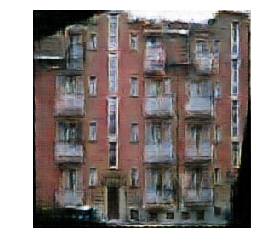

INFO:root:speed: 34.34618014469552 samples/s
INFO:root:discriminator loss = 0.295593, generator loss = 14.292765, binary training acc = 0.941388 at iter 0 epoch 92
INFO:root:speed: 17.242154134672266 samples/s
INFO:root:discriminator loss = 0.340410, generator loss = 15.201947, binary training acc = 0.787243 at iter 10 epoch 92
INFO:root:speed: 17.263479890779568 samples/s
INFO:root:discriminator loss = 0.527635, generator loss = 14.517660, binary training acc = 0.771096 at iter 20 epoch 92
INFO:root:speed: 19.012784876457587 samples/s
INFO:root:discriminator loss = 0.475262, generator loss = 16.642496, binary training acc = 0.782646 at iter 30 epoch 92
INFO:root:
binary training acc at epoch 92: facc=0.783088
INFO:root:time: 24.773673


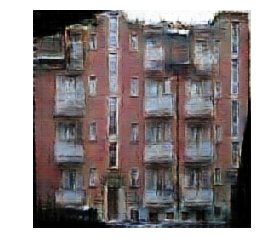

INFO:root:speed: 25.046931226852376 samples/s
INFO:root:discriminator loss = 0.382267, generator loss = 14.461612, binary training acc = 0.786653 at iter 0 epoch 93
INFO:root:speed: 17.576246213879955 samples/s
INFO:root:discriminator loss = 0.198460, generator loss = 14.514605, binary training acc = 0.740538 at iter 10 epoch 93
INFO:root:speed: 16.233786742052445 samples/s
INFO:root:discriminator loss = 0.601850, generator loss = 15.111453, binary training acc = 0.735343 at iter 20 epoch 93
INFO:root:speed: 16.58693729018195 samples/s
INFO:root:discriminator loss = 0.416066, generator loss = 16.457365, binary training acc = 0.766681 at iter 30 epoch 93
INFO:root:
binary training acc at epoch 93: facc=0.752298
INFO:root:time: 24.993976


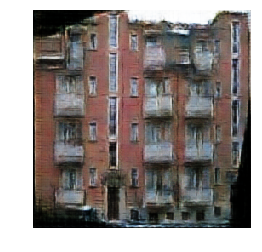

INFO:root:speed: 40.04215864481342 samples/s
INFO:root:discriminator loss = 0.533137, generator loss = 15.094641, binary training acc = 0.805429 at iter 0 epoch 94
INFO:root:speed: 16.052484835634697 samples/s
INFO:root:discriminator loss = 0.440973, generator loss = 14.574498, binary training acc = 0.743109 at iter 10 epoch 94
INFO:root:speed: 14.437508089099886 samples/s
INFO:root:discriminator loss = 0.891076, generator loss = 16.011324, binary training acc = 0.669207 at iter 20 epoch 94
INFO:root:speed: 18.3279272634158 samples/s
INFO:root:discriminator loss = 0.712817, generator loss = 14.972104, binary training acc = 0.634137 at iter 30 epoch 94
INFO:root:
binary training acc at epoch 94: facc=0.648802
INFO:root:time: 24.821306


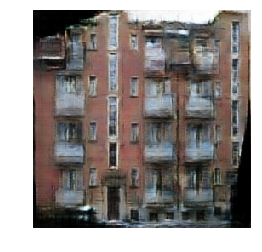

INFO:root:speed: 28.065119204544693 samples/s
INFO:root:discriminator loss = 0.428652, generator loss = 13.880354, binary training acc = 0.888612 at iter 0 epoch 95
INFO:root:speed: 16.0453613942309 samples/s
INFO:root:discriminator loss = 0.307330, generator loss = 14.150821, binary training acc = 0.766219 at iter 10 epoch 95
INFO:root:speed: 14.352287884522074 samples/s
INFO:root:discriminator loss = 0.380931, generator loss = 14.158745, binary training acc = 0.739615 at iter 20 epoch 95
INFO:root:speed: 18.94734654732902 samples/s
INFO:root:discriminator loss = 0.454089, generator loss = 15.887044, binary training acc = 0.759829 at iter 30 epoch 95
INFO:root:
binary training acc at epoch 95: facc=0.765410
INFO:root:time: 24.761474


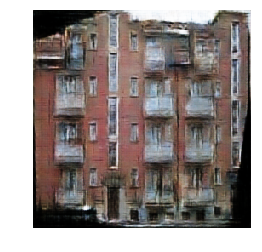

INFO:root:speed: 26.860134419017186 samples/s
INFO:root:discriminator loss = 0.550645, generator loss = 14.040349, binary training acc = 0.517306 at iter 0 epoch 96
INFO:root:speed: 39.98775856923988 samples/s
INFO:root:discriminator loss = 0.231075, generator loss = 14.341504, binary training acc = 0.816397 at iter 10 epoch 96
INFO:root:speed: 14.816966846878417 samples/s
INFO:root:discriminator loss = 0.497150, generator loss = 14.642487, binary training acc = 0.773314 at iter 20 epoch 96
INFO:root:speed: 17.200182241463377 samples/s
INFO:root:discriminator loss = 0.862001, generator loss = 16.710470, binary training acc = 0.786636 at iter 30 epoch 96
INFO:root:
binary training acc at epoch 96: facc=0.754750
INFO:root:time: 23.615061


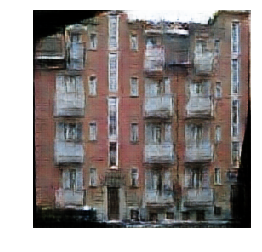

INFO:root:speed: 25.208698955182975 samples/s
INFO:root:discriminator loss = 0.422926, generator loss = 14.623189, binary training acc = 0.799673 at iter 0 epoch 97
INFO:root:speed: 17.82224091849699 samples/s
INFO:root:discriminator loss = 0.270008, generator loss = 14.540942, binary training acc = 0.815844 at iter 10 epoch 97
INFO:root:speed: 14.843421043784211 samples/s
INFO:root:discriminator loss = 0.452026, generator loss = 14.384854, binary training acc = 0.784583 at iter 20 epoch 97
INFO:root:speed: 14.09272164020133 samples/s
INFO:root:discriminator loss = 0.493223, generator loss = 16.359215, binary training acc = 0.803705 at iter 30 epoch 97
INFO:root:
binary training acc at epoch 97: facc=0.789962
INFO:root:time: 25.075207


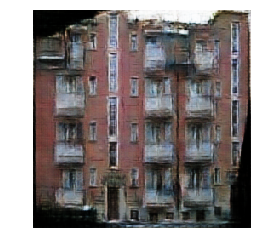

INFO:root:speed: 33.11179354390508 samples/s
INFO:root:discriminator loss = 0.306404, generator loss = 13.762042, binary training acc = 0.930939 at iter 0 epoch 98
INFO:root:speed: 13.341438130781786 samples/s
INFO:root:discriminator loss = 0.454042, generator loss = 14.575027, binary training acc = 0.745633 at iter 10 epoch 98
INFO:root:speed: 15.378695853516255 samples/s
INFO:root:discriminator loss = 0.455167, generator loss = 13.752988, binary training acc = 0.718152 at iter 20 epoch 98
INFO:root:speed: 17.727015298057694 samples/s
INFO:root:discriminator loss = 0.341102, generator loss = 15.569150, binary training acc = 0.758575 at iter 30 epoch 98
INFO:root:
binary training acc at epoch 98: facc=0.734152
INFO:root:time: 25.249743


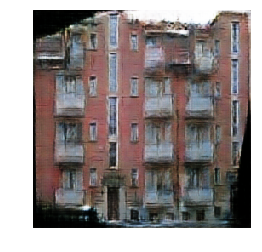

INFO:root:speed: 29.642310943255413 samples/s
INFO:root:discriminator loss = 0.382955, generator loss = 13.029286, binary training acc = 0.673020 at iter 0 epoch 99
INFO:root:speed: 16.59344032966094 samples/s
INFO:root:discriminator loss = 0.502322, generator loss = 15.742520, binary training acc = 0.790212 at iter 10 epoch 99
INFO:root:speed: 19.46394952176635 samples/s
INFO:root:discriminator loss = 0.306984, generator loss = 13.420590, binary training acc = 0.776210 at iter 20 epoch 99
INFO:root:speed: 15.621313763785908 samples/s
INFO:root:discriminator loss = 0.560959, generator loss = 16.332317, binary training acc = 0.781094 at iter 30 epoch 99
INFO:root:
binary training acc at epoch 99: facc=0.773463
INFO:root:time: 25.048347


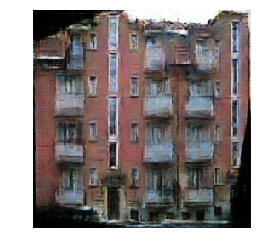

In [8]:
from datetime import datetime
import time
import logging

def facc(label, pred):
        pred = pred.ravel()
        label = label.ravel()
        return ((pred > 0.5) == label).mean()

def train():
    image_pool = ImagePool(pool_size)
    metric = mx.metric.CustomMetric(facc)

    stamp =  datetime.now().strftime('%Y_%m_%d-%H_%M')
    logging.basicConfig(level=logging.DEBUG)

    for epoch in range(epochs):
        tic = time.time()
        btic = time.time()
        train_data.reset()
        iter = 0
        for batch in train_data:
            ############################
            # (1) Update D network: maximize log(D(x, y)) + log(1 - D(x, G(x, z)))
            ###########################
            real_in = batch.data[0].as_in_context(ctx)
            real_out = batch.data[1].as_in_context(ctx)

            fake_out = netG(real_in)
            fake_concat = image_pool.query(nd.concat(real_in, fake_out, dim=1))
            with autograd.record():
                # Train with fake image
                # Use image pooling to utilize history images
                output = netD(fake_concat)
                fake_label = nd.zeros(output.shape, ctx=ctx)
                errD_fake = GAN_loss(output, fake_label)
                metric.update([fake_label,], [output,])

                # Train with real image
                real_concat = nd.concat(real_in, real_out, dim=1)
                output = netD(real_concat)
                real_label = nd.ones(output.shape, ctx=ctx)
                errD_real = GAN_loss(output, real_label)
                errD = (errD_real + errD_fake) * 0.5
                errD.backward()
                metric.update([real_label,], [output,])

            trainerD.step(batch.data[0].shape[0])

            ############################
            # (2) Update G network: maximize log(D(x, G(x, z))) - lambda1 * L1(y, G(x, z))
            ###########################
            with autograd.record():
                fake_out = netG(real_in)
                fake_concat = nd.concat(real_in, fake_out, dim=1)
                output = netD(fake_concat)
                real_label = nd.ones(output.shape, ctx=ctx)
                errG = GAN_loss(output, real_label) + L1_loss(real_out, fake_out) * lambda1
                errG.backward()

            trainerG.step(batch.data[0].shape[0])

            # Print log infomation every ten batches
            if iter % 10 == 0:
                name, acc = metric.get()
                logging.info('speed: {} samples/s'.format(batch_size / (time.time() - btic)))
                logging.info('discriminator loss = %f, generator loss = %f, binary training acc = %f at iter %d epoch %d'
                         %(nd.mean(errD).asscalar(),
                           nd.mean(errG).asscalar(), acc, iter, epoch))
            iter = iter + 1
            btic = time.time()

        name, acc = metric.get()
        metric.reset()
        logging.info('\nbinary training acc at epoch %d: %s=%f' % (epoch, name, acc))
        logging.info('time: %f' % (time.time() - tic))

        # Visualize one generated image for each epoch
        fake_img = fake_out[0]
        visualize(fake_img)
        plt.show()

train()

/opt/conda/envs/pytorch-py3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


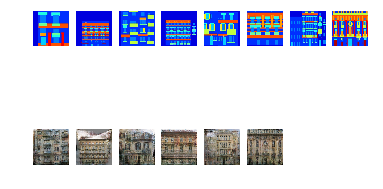

In [14]:
def print_result():
    num_image = 8
    img_in_list, img_out_list = val_data.next().data
    for i in range(num_image):
        img_in = nd.expand_dims(img_in_list[i], axis=0)
        plt.subplot(2,8,i+1)
        visualize(img_in[0])
        img_out = netG(img_in.as_in_context(ctx))
        plt.subplot(2,8,i+7)
        visualize(img_out[0])
    plt.show()

print_result()